In [81]:
# Importing Python modules
from error_reduction_rate.err import err
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
from scipy import signal
from time import perf_counter
from loguru import logger
import os
import mat73
from bispectrum_real_data_analysis.scripts.utils import seconds_to_formatted_time
import matplotlib 
from numpy.linalg import inv
from high_order_spectra_analysis.hosa.hosa import Tdhosa, tdqs
from pathos.multiprocessing import ProcessingPool as Pool
import pickle
import plotly
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [82]:
fontsize = 30
matplotlib.rc('xtick', labelsize=fontsize) 
matplotlib.rc('ytick', labelsize=fontsize) 
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['axes.labelsize'] = fontsize
plt.rcParams['axes.titlesize'] = fontsize
plt.rcParams.update({'font.size': fontsize})

%matplotlib inline

In [83]:
id_file: str = "test_freezing"

In [84]:
# Select the zoom to plot the figures
# ----------------------------------------------------------
lim = None
lim: tuple[float, float] = (4, 15)
lim: tuple[float, float] = (50, 60)


zoom = bool(lim)
logger.info(f"zoom: {zoom}")
logger.info(f"Limits: {lim}")

2023-09-07 20:00:44.700 | INFO     | __main__:<module>:9 - zoom: True
2023-09-07 20:00:44.701 | INFO     | __main__:<module>:10 - Limits: (50, 60)


In [85]:
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

if zoom and lim[0]==50 and lim[1]==60:
    ticks = [50, 53.71, 56, 60]   
elif zoom and lim[0]==4 and lim[1]==15:
    ticks = [4, 8, 12, 15]   
elif not zoom:
    ticks = [4, 10, 20, 30, 40, 53.71, 60]
else:
    ticks = np.linspace(lim[0], lim[1], 4)


labels = np.round(ticks, 2)

In [86]:
labels

array([50.  , 53.71, 56.  , 60.  ])

# Methods

In [7]:
def decimate(
    data: pd.DataFrame, 
    desired_frequency_sampling: float, 
    FrequencySampling: float | None = None, 
    filter_antialiasing: bool = True, 
    time: np.ndarray | None = None,
    columns_to_exclude: list | None = None
):
        
    if FrequencySampling is None:
        if time is None:
            time = data.Time.to_numpy()
        TimeSampling = round(np.mean(time[1:] - time[:-1]), 6)
        FrequencySampling = 1.0/TimeSampling
    else:
        TimeSampling = 1.0/FrequencySampling
        
    logger.info(f"The time sampling is {TimeSampling} seconds and the frequency is "
        f"{FrequencySampling/float(1000**(FrequencySampling<=1000))} {'k'*bool(FrequencySampling>=1000)}Hz")

    newTimeSampling = 1.0/desired_frequency_sampling
    decimation_rate = np.ceil(newTimeSampling/TimeSampling).astype(int)
    logger.info(f"The data will be decimated by the rate 1:{decimation_rate}")

    if filter:
        if columns_to_exclude:
            matrix = data.loc[:, ~data.columns.isin(columns_to_exclude)].to_numpy()
        else:
            matrix = data.to_numpy()
        decimated_matrix = signal.decimate(matrix, decimation_rate, axis=0, ftype='fir', zero_phase=True)
        new_data = data.copy()[::decimation_rate]
        if columns_to_exclude:
            new_data.loc[:, ~data.columns.isin(columns_to_exclude)] = decimated_matrix
        else:
            new_data.iloc[:] = decimated_matrix
    else:
        new_data = data[::decimation_rate]

    TimeSampling = TimeSampling*decimation_rate
    
    FrequencySampling = 1.0/TimeSampling
    logger.info(f"The new time sampling is {np.round(TimeSampling, 5)} s and the new frequency is "
    f"{FrequencySampling/float(1000**(FrequencySampling>=1000))} {'k'*bool(FrequencySampling>=1000)}Hz")
    
    return new_data, TimeSampling, FrequencySampling

In [8]:
# Method to extract events from dataframe

def select_event_window(
    df: pd.DataFrame, 
    event_name: str, 
    samples_before: int = 0, 
    samples_after: int = 0,
    freezing: bool = False
) -> pd.DataFrame:
    """
    Method to extract the slice of the dataframe which contais the event, with some data before and after, 
    given number of samples to add to the begin and end, respectively.
    """
    if not freezing:
        window_index = np.argwhere(df.event.to_numpy() == event_name).flatten()
    else:
        window_index = np.argwhere(df.freezing.to_numpy() == event_name).flatten()
    begin_index = window_index[0] - samples_before
    end_index = window_index[-1] + samples_after
    return df[begin_index:end_index]

In [9]:
def moving_average(x, N):
    return np.convolve(x, np.ones(N), 'same') / N

In [10]:
def get_events(data, threshold, window_size, time_sampling):
    
    x = data.CS_modulating.to_numpy()
    time = data.Time.to_numpy()
    N = len(x)
    index = np.arange(N)
    plt.figure(figsize=(16,14))
    plt.subplot(321)
    plt.plot(index, x)
    plt.ylabel("x")

    x = x - np.mean(x[:10])
    plt.subplot(322)
    plt.plot(index, x)
    plt.ylabel("$x - \overline{x}$")

    x = x**2
    plt.subplot(323)
    plt.plot(index, x)
    
    plt.ylabel("$(x - \overline{x})^2$")

    x = moving_average(x, window_size)
    plt.subplot(324)
    plt.plot(index, x)
    plt.axhline(threshold, color="red", label="threshold")
    plt.legend(loc='upper right')
    plt.ylabel("$\dfrac{1}{k} \sum _{i=n-k+1}^{n}(x - \overline{x})_i^2$")

    x[x>threshold] = 1
    x[x<threshold] = 0

    plt.subplot(325)
    plt.plot(index, x)
    plt.ylabel("threshold($\dfrac{1}{k} \sum _{i=n-k+1}^{n}(x - \overline{x})_i^2$)")

    indices = index[np.append(False, x[1:] - x[:-1]) != 0]

    for event, s, e in zip(range(1, 6), indices[0::2], indices[1::2]):
        print(f"\nEvent: {event}")
        print(f"index start: {s}\nindex end: {e}") 
        print(f"time start: {time[s]}\ntime end: {time[e]}")
        print(f"time duration: {(e-s)*time_sampling}")

    print(f"\nlen(indices) = {len(indices)}")

    data = data.assign(event=np.empty(len(data), dtype=str))
    data.loc[:, "event"] = "base"

    for i, event in zip(range(0, len(indices), 2), np.arange(1, 6)):
        start = indices[i]
        end = indices[i+1]
        data.loc[start:end, "event"] = f"event_{event}"

    data.event.unique()

    plt.subplot(326)
    for event in data.event.unique():
        plt.plot(data.loc[data.event==event, "Time"], data.loc[data.event==event, "CS_modulating"], label=event)

    plt.legend(loc="center left")
    plt.ylabel("events")
    
    plt.show()
    return data

In [11]:
def butter_bandpass(lowcut, highcut, fs, order=5):
    return signal.butter(order, [lowcut, highcut], fs=fs, btype='band')

In [12]:
def butter_bandpass_filter(data, lowcut, highcut, fs, order=5, filtfilt=False):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    if filtfilt:
        return signal.filtfilt(b, a, data)
    return signal.lfilter(b, a, data)

In [13]:
def filter_function(column): 
    return butter_bandpass_filter(
        data=column, 
        lowcut=low_cut_hz, 
        highcut=high_cut_hz,
        fs=fs,
        order=filter_order, 
        filtfilt=True
    )

In [14]:
# Método que calcula a FFT unilateral e retorna um plot,
# o vetor de frequências em Hertz e os ganhos
def fft(x, fs):
    N = len(x)
    FFT = np.fft.fft(x)
    P2 = np.abs(FFT/N)
    intensity = P2[0:N//2]
    intensity[1:-1] = 2*intensity[1:-1]
    frequency = fs*np.arange(0,N//2)/N
    angle = np.angle(FFT)
    angle = angle[0:N//2]
    return frequency, intensity, angle

In [15]:
class TDQS(Tdhosa):

    def run_td4spectrum(self, signal_dict: np.ndarray | pd.Series): 
        event, signal = list(signal_dict.items())[0]
        return {
            event: self.run_tdqs(
                signal
            )
        }

In [16]:
def get_time_given_time_sampling_and_N(time_sampling: float, N: int, start_in_seconds: float = 0):
    end_time = (N)*time_sampling + start_in_seconds
    return np.arange(start_in_seconds, end_time, time_sampling)

# Loading files

In [17]:
BASE_PATH = "/home/matheus/Documents/repositories/bispectrum_real_data_analysis/bispectrum_real_data_analysis/data/"    

In [18]:
list_of_files: list[str] = os.listdir(BASE_PATH)
[(i, file) for i, file in enumerate(list_of_files)]

[(0, 'rats'),
 (1, '1_Etapa_paper_Simoes-20230328T020230Z-001.zip'),
 (2, 'only_rats'),
 (3, '.gitkeep'),
 (4, 'F04__PT_data.mat'),
 (5, 'rats_simoes'),
 (6, 'F04__T_data.mat'),
 (7, 'html')]

In [19]:
file_to_load: str = "F04__T_data.mat"
file_to_load

'F04__T_data.mat'

In [20]:
# Loading and creating the data matrix

logger.info(f"Loading .mat file...")

complete_path: str = f"{BASE_PATH}/{file_to_load}"

complete_data = mat73.loadmat(complete_path)

data = complete_data["data"]["data"][0]

FrequencySampling = complete_data["parameters"]["srate"].item()
TimeSampling = 1.0/FrequencySampling

logger.info(f"Time Sampling: {TimeSampling}")

logger.info(f"Frequency Sampling: {FrequencySampling}")

logger.success("Loaded!")

2023-09-07 19:39:22.827 | INFO     | __main__:<module>:3 - Loading .mat file...
2023-09-07 19:39:23.525 | INFO     | __main__:<module>:14 - Time Sampling: 0.001
2023-09-07 19:39:23.525 | INFO     | __main__:<module>:16 - Frequency Sampling: 1000.0
2023-09-07 19:39:23.526 | SUCCESS  | __main__:<module>:18 - Loaded!


In [21]:
all_columns = [
    "CS_modulating",
    "mPFC_pre_limbic_1",
    "mPFC_pre_limbic_2",
    "mPFC_infra_limbic_1" ,
    "mPFC_infra_limbic_2" ,
    "Hippocampus_CA1" ,
    "Hippocampus_MOL_layer" ,
    "Hippocampus_GD_1" ,
    "Hippocampus_GD_2" ,
    "Amygdala_lateral_1" ,
    "Amygdala_lateral_2" ,
    "Amygdala_basolateral_1",
    "Amygdala_basolateral_2" ,
    "Inferior_colliculus_1" ,
    "Inferior_colliculus_2" ,
    "Inferior_colliculus_3" ,
    "Inferior_colliculus_4"
]

columns = [
    "CS_modulating",
    "mPFC_pre_limbic_2",
    "mPFC_infra_limbic_1" ,
    "Amygdala_lateral_1" ,
    "Amygdala_basolateral_2" ,
    "Inferior_colliculus_3"
]

In [22]:
data = pd.DataFrame(data=data.T, columns=all_columns)

In [23]:
data = data.loc[:, columns]

In [24]:
time = get_time_given_time_sampling_and_N(
    time_sampling=TimeSampling,
    N=data.shape[0],
    start_in_seconds=0
)

data = data.assign(Time=time)

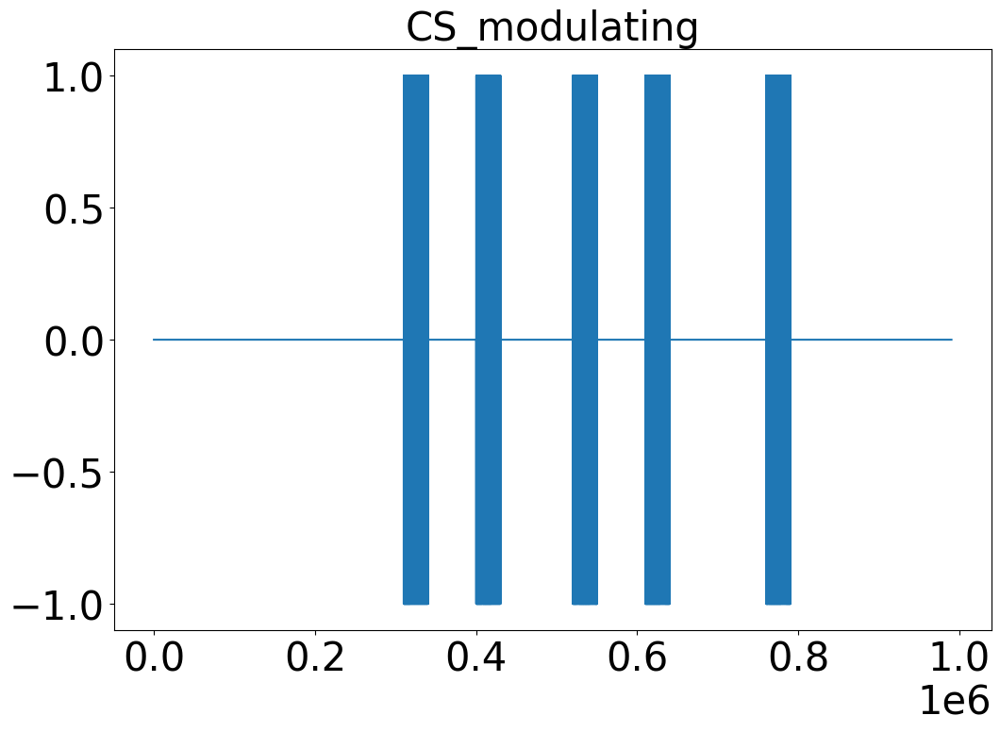

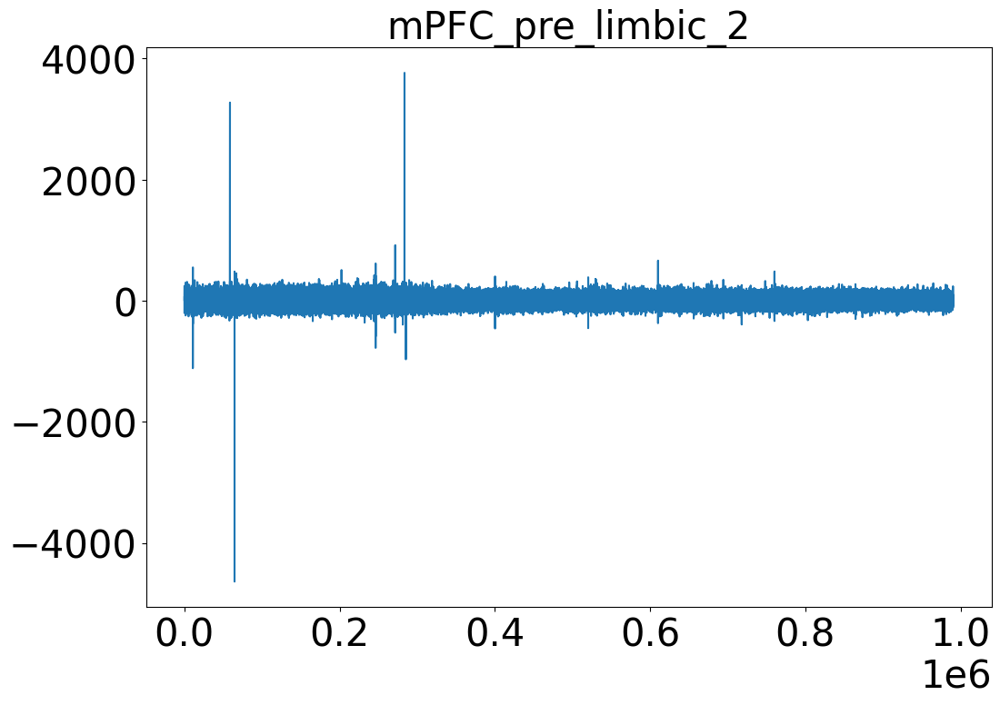

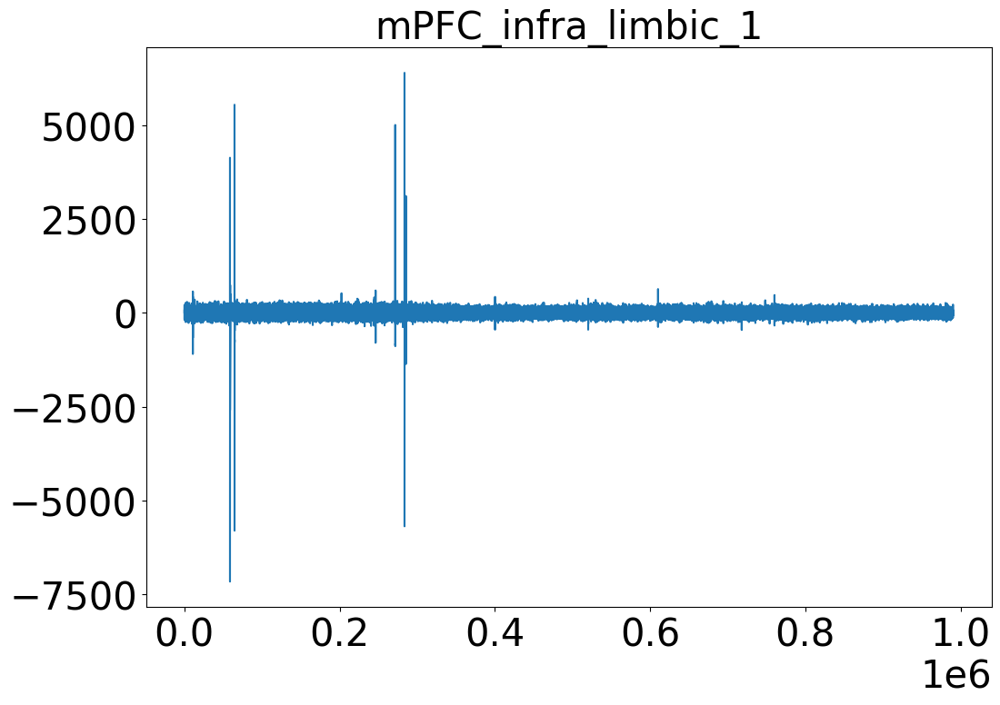

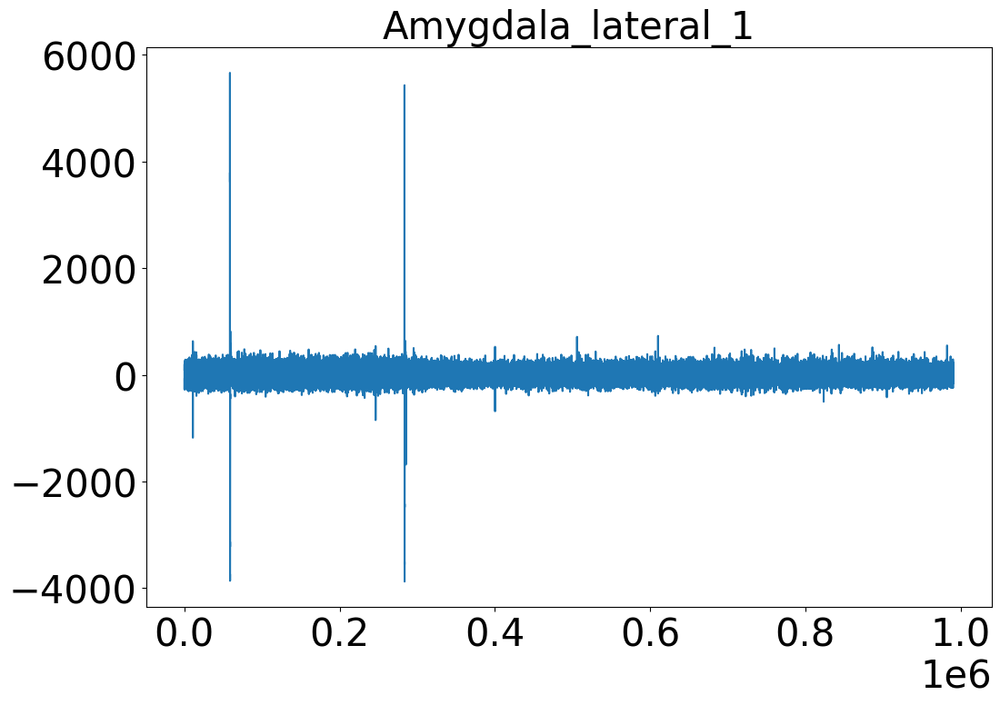

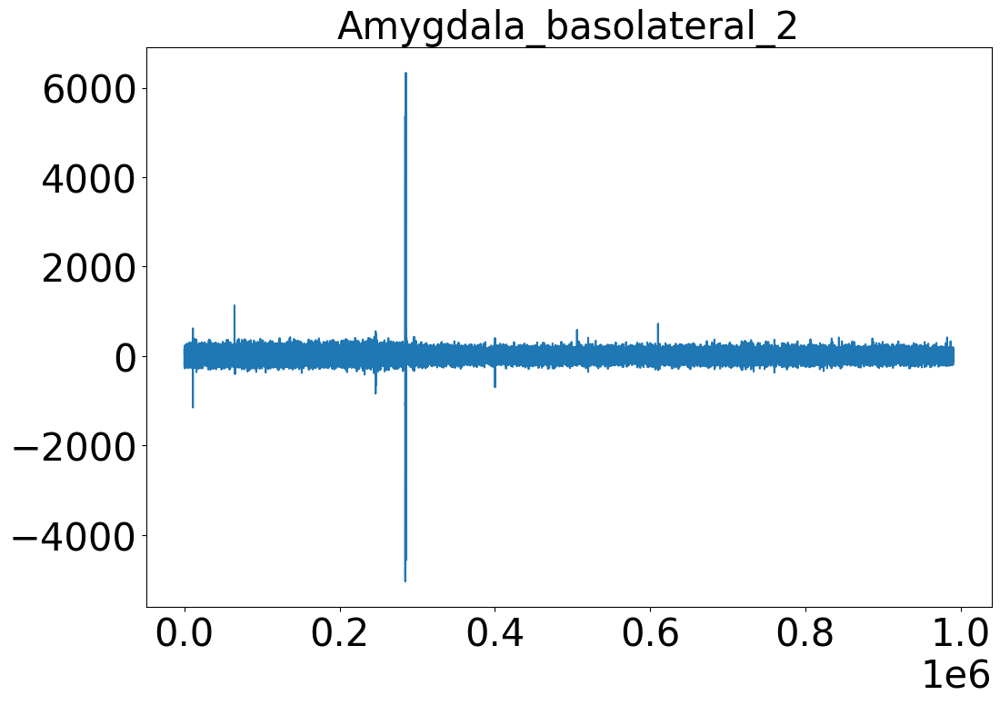

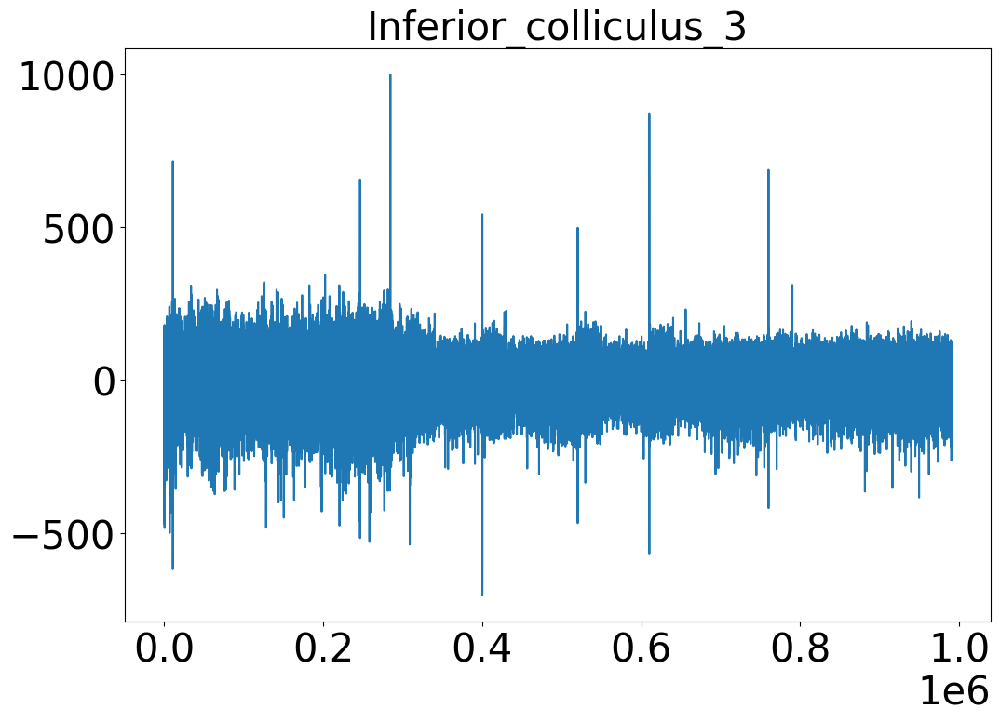

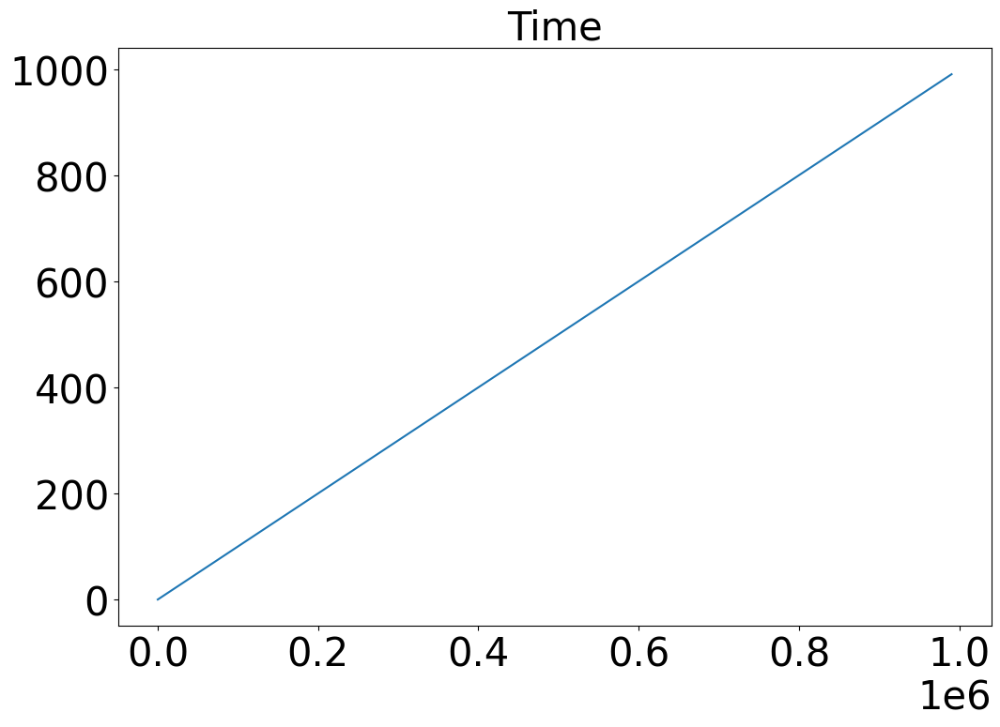

In [25]:
for column in data.columns:
    data.loc[:, column].plot()
    plt.title(column)
    plt.show()


Event: 1
index start: 310187
index end: 340268
time start: 310.187
time end: 340.26800000000003
time duration: 30.081

Event: 2
index start: 400188
index end: 430269
time start: 400.188
time end: 430.269
time duration: 30.081

Event: 3
index start: 520189
index end: 550270
time start: 520.189
time end: 550.27
time duration: 30.081

Event: 4
index start: 610190
index end: 640271
time start: 610.19
time end: 640.271
time duration: 30.081

Event: 5
index start: 760191
index end: 790271
time start: 760.191
time end: 790.2710000000001
time duration: 30.080000000000002

len(indices) = 10


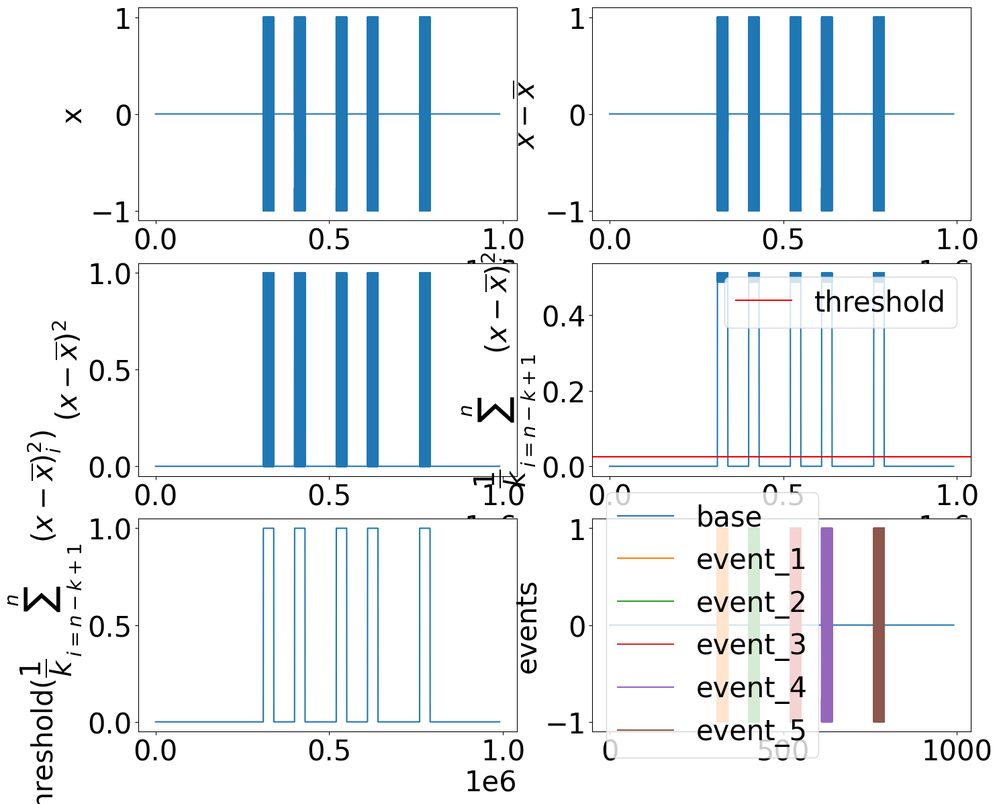

In [26]:
threshold = 0.025
window_size = 100

data = get_events(
    data=data, 
    threshold=threshold, 
    window_size=window_size, 
    time_sampling=TimeSampling
)

In [27]:
base_interval_1: tuple[int, float, float] = (1, 260.0, 290.0)
base_interval_2: tuple[int, float, float] = (2, 480.0, 510.0)
base_interval_3: tuple[int, float, float] = (3, 810.0, 840.0)
    
for base_index, time_start, time_end in [base_interval_1, base_interval_2, base_interval_3]:
    data.loc[(data.Time >= time_start)&(data.Time <= time_end), "event"] = f"base_{base_index}"

In [28]:
complete_data["data"]["events"]["behavior"]["TS_LFPsec"]

array([[167.4185    , 170.77773333],
       [325.33656667, 330.02476667],
       [331.70486667, 411.27233333],
       [413.28803333, 528.5024    ],
       [529.83116667, 531.17446667],
       [533.1905    , 540.91846667],
       [542.59886667, 621.5903    ],
       [623.2704    , 771.20406667],
       [773.55603333, 986.3222    ]])

In [29]:
for time_start, time_end in complete_data["data"]["events"]["behavior"]["TS_LFPsec"]:
    print(time_start, time_end)

167.41850000000002 170.77773333333332
325.3365666666666 330.02476666666666
331.7048666666667 411.27233333333334
413.2880333333334 528.5024000000001
529.8311666666667 531.1744666666667
533.1905 540.9184666666667
542.5988666666667 621.5903000000001
623.2704 771.2040666666667
773.5560333333334 986.3222000000001


In [30]:
freezing_list = ["base"]*max(data.shape)
data["freezing"] = freezing_list

base_index = 1

for time_start, time_end in complete_data["data"]["events"]["behavior"]["TS_LFPsec"]:
    data.loc[(data.Time >= time_start)&(data.Time <= time_end), "freezing"] = f"freezing_{base_index}"
    base_index += 1

data.freezing.unique()

array(['base', 'freezing_1', 'freezing_2', 'freezing_3', 'freezing_4',
       'freezing_5', 'freezing_6', 'freezing_7', 'freezing_8',
       'freezing_9'], dtype=object)

In [31]:
data.head()

,CS_modulating,mPFC_pre_limbic_2,mPFC_infra_limbic_1,Amygdala_lateral_1,Amygdala_basolateral_2,Inferior_colliculus_3,Time,event,freezing
0,0.0,11.161125,17.337057,96.508664,60.974236,29.417536,0.000,base,base
1,0.0,88.655261,99.989904,137.882595,104.658336,60.556178,0.001,base,base
2,0.0,100.122936,102.409270,148.353453,107.712732,94.126030,0.002,base,base
3,0.0,121.655629,109.487511,174.339384,129.453379,89.758389,0.003,base,base
4,0.0,126.413963,123.075414,167.174547,120.376940,77.643497,0.004,base,base


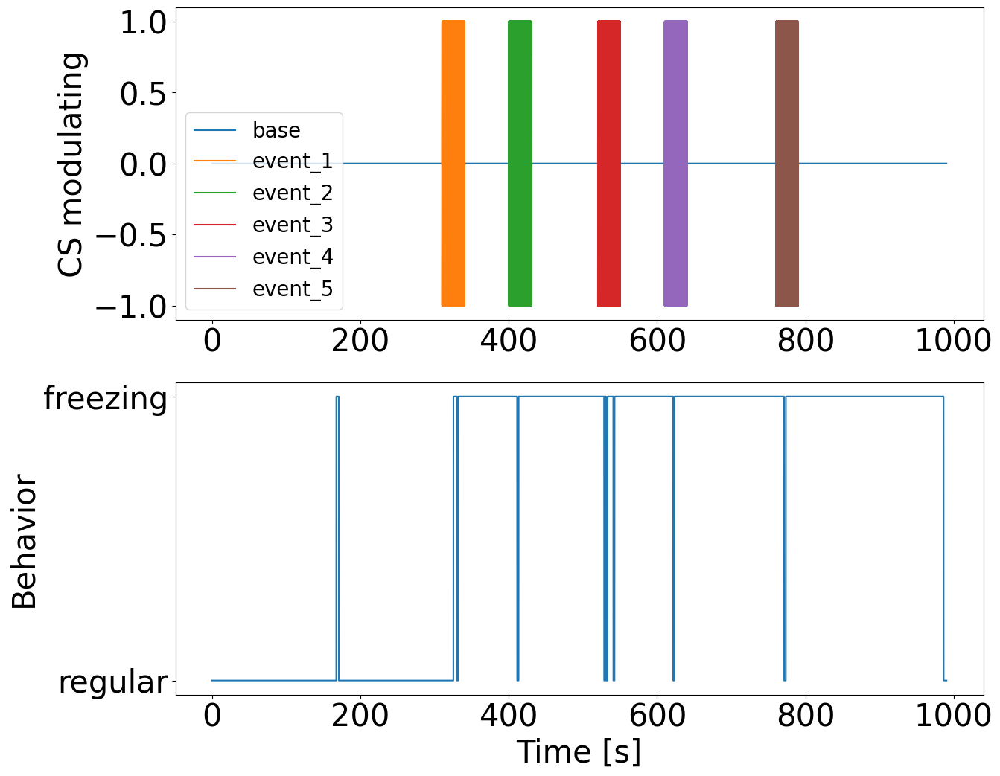

In [32]:
plt.figure(figsize=(14,12))
plt.subplot(211)
for event in data.event.unique():
    if "base_" in event:
        continue
    plt.plot(data.loc[data.event==event, "Time"], data.loc[data.event==event, "CS_modulating"], label=event)
plt.legend(loc='lower left', prop={'size': 20})
plt.ylabel("CS modulating", fontsize=30)

plt.subplot(212)
freezing = [int(event.startswith("freezing")) for event in data.freezing.to_numpy()]
plt.plot(data.Time, freezing)
plt.ylabel("Behavior", fontsize=30)
plt.yticks([0,1], ["regular", "freezing"])
plt.xlabel("Time [s]")

plt.savefig(
    f"freezing_behavior.png",
    format="png",
    bbox_inches='tight', 
    dpi=300
)

plt.show()

# Data filtering

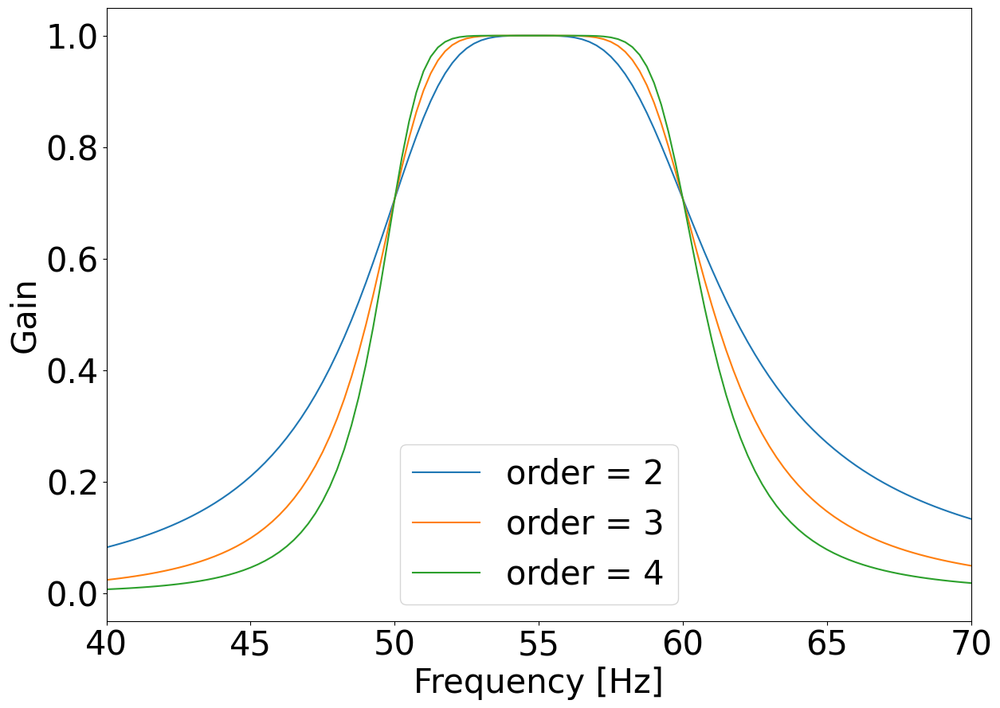

In [33]:
low_cut_hz = 50
high_cut_hz = 60
fs = 1.0/TimeSampling

plt.figure(figsize=(14,10))
plt.clf()

for order in range(2,5):
    b, a = butter_bandpass(low_cut_hz, high_cut_hz, fs, order=order)
    w, h = signal.freqz(b, a, fs=fs, worN=2000)
    plt.plot(w, abs(h), label="order = %d" % order)


plt.xlabel('Frequency [Hz]')
plt.ylabel('Gain')
plt.legend()
plt.xlim([low_cut_hz-10, high_cut_hz+10])
plt.show()

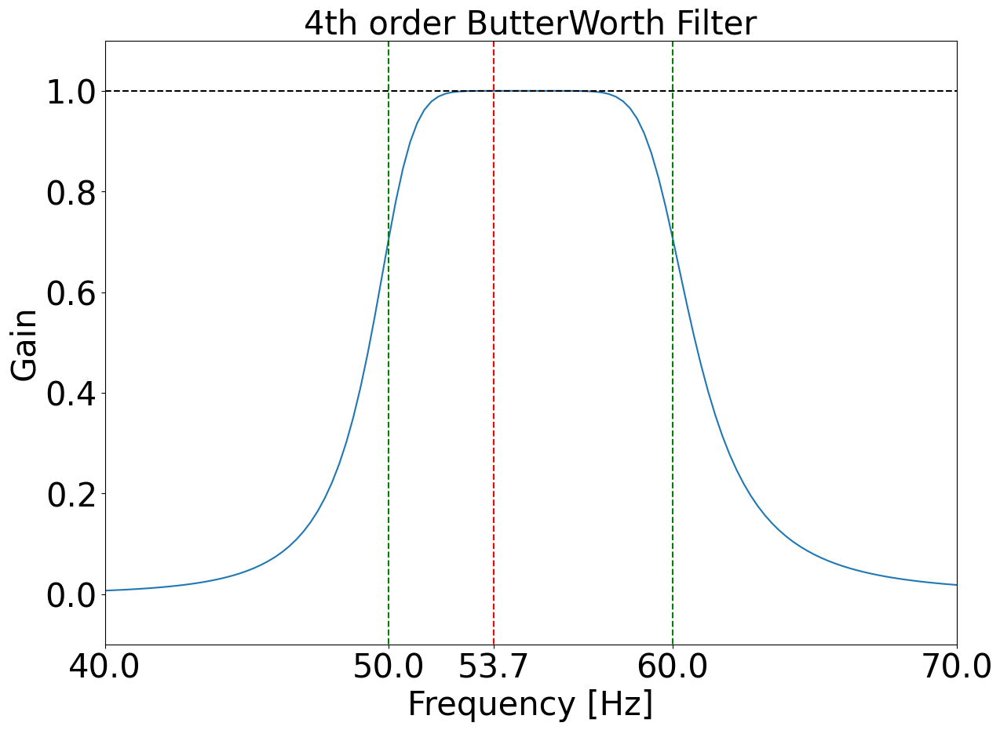

In [34]:
filter_order = 4
b, a = butter_bandpass(low_cut_hz, high_cut_hz, fs=fs, order=filter_order)

plt.figure(figsize=(14,10))
plt.clf()
w, h = signal.freqz(b, a, fs=fs, worN=2000)
plt.plot(w, abs(h))
plt.xlabel('Frequency [Hz]')
plt.ylabel('Gain')
plt.xlim([low_cut_hz-10, high_cut_hz+10])
plt.ylim([-0.1, 1.1])
plt.title(f"{filter_order}th order ButterWorth Filter")
plt.hlines(y=1, xmin=40, xmax=70, colors="black", linestyles='dashed')
plt.vlines(x=low_cut_hz, ymin=-1, ymax=2, colors="green", linestyles='dashed')
plt.vlines(x=53.71, ymin=-1, ymax=2, colors="red", linestyles='dashed')
plt.vlines(x=high_cut_hz, ymin=-1, ymax=2, colors="green", linestyles='dashed')
plt.xticks([40, 50, 53.71, 60, 70])
plt.savefig(
    f"butter_filter.png",
    format="png",
    bbox_inches='tight', 
    dpi=300
)
plt.show()

## Filtering using filtfilt to avoid phase changes

## Filtering data

In [35]:
data.columns

Index(['CS_modulating', 'mPFC_pre_limbic_2', 'mPFC_infra_limbic_1',
       'Amygdala_lateral_1', 'Amygdala_basolateral_2', 'Inferior_colliculus_3',
       'Time', 'event', 'freezing'],
      dtype='object')

In [36]:
for column in columns[1:]:
    logger.info(f"Filtering the {column}")
    data = data.assign(
        **{
            f"filtered_{column}": filter_function(data.loc[:, column].to_numpy())
        }
    )
    
logger.success(f"Done filtering!")

2023-09-07 19:39:30.655 | INFO     | __main__:<module>:2 - Filtering the mPFC_pre_limbic_2
2023-09-07 19:39:30.710 | INFO     | __main__:<module>:2 - Filtering the mPFC_infra_limbic_1
2023-09-07 19:39:30.772 | INFO     | __main__:<module>:2 - Filtering the Amygdala_lateral_1
2023-09-07 19:39:30.837 | INFO     | __main__:<module>:2 - Filtering the Amygdala_basolateral_2
2023-09-07 19:39:30.910 | INFO     | __main__:<module>:2 - Filtering the Inferior_colliculus_3
2023-09-07 19:39:30.984 | SUCCESS  | __main__:<module>:9 - Done filtering!


## Decimation

In [37]:
data.columns

Index(['CS_modulating', 'mPFC_pre_limbic_2', 'mPFC_infra_limbic_1',
       'Amygdala_lateral_1', 'Amygdala_basolateral_2', 'Inferior_colliculus_3',
       'Time', 'event', 'freezing', 'filtered_mPFC_pre_limbic_2',
       'filtered_mPFC_infra_limbic_1', 'filtered_Amygdala_lateral_1',
       'filtered_Amygdala_basolateral_2', 'filtered_Inferior_colliculus_3'],
      dtype='object')

In [38]:
desired_frequency_sampling = 250

data, TimeSampling, FrequencySampling = decimate(
    data=data, 
    desired_frequency_sampling=desired_frequency_sampling,
    filter_antialiasing=True,
    columns_to_exclude=["Time", "event", "freezing"]
)

data_backup = data

2023-09-07 19:39:31.004 | INFO     | __main__:decimate:18 - The time sampling is 0.001 seconds and the frequency is 1.0 kHz
2023-09-07 19:39:31.005 | INFO     | __main__:decimate:23 - The data will be decimated by the rate 1:4
2023-09-07 19:39:31.486 | INFO     | __main__:decimate:42 - The new time sampling is 0.004 s and the new frequency is 250.0 Hz


In [39]:
data.columns

Index(['CS_modulating', 'mPFC_pre_limbic_2', 'mPFC_infra_limbic_1',
       'Amygdala_lateral_1', 'Amygdala_basolateral_2', 'Inferior_colliculus_3',
       'Time', 'event', 'freezing', 'filtered_mPFC_pre_limbic_2',
       'filtered_mPFC_infra_limbic_1', 'filtered_Amygdala_lateral_1',
       'filtered_Amygdala_basolateral_2', 'filtered_Inferior_colliculus_3'],
      dtype='object')

In [40]:
data = data_backup

In [41]:
frequency_array = np.arange(start=4, stop=60, step=0.01)

TDQS_PARAMETERS = {
    "frequency_array": frequency_array,
    "phase_step": 0.01
}

tdqs_object = TDQS(
    frequency_sampling=FrequencySampling,
    frequency_array=TDQS_PARAMETERS.get("frequency_array"),
    fmin=TDQS_PARAMETERS.get("fmin"),
    fmax=TDQS_PARAMETERS.get("fmax"),
    freq_step=TDQS_PARAMETERS.get("freq_step"),
    phase_step=TDQS_PARAMETERS["phase_step"]
)

# Selecting Data to model - EVENT 1

In [42]:
event_number = 1
id_results: str = f"event_{event_number}"

event_data = select_event_window(
    df=data_backup, 
    event_name=f"event_{event_number}", 
    samples_before=0, 
    samples_after=0,
    freezing=False
)

In [43]:
path_files = f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv'
load_already_calculated: bool = os.path.isfile(path_files)
if load_already_calculated:
    logger.info("HOSA already calculated. Loading...")
    hosa_df = pd.read_csv(path_files)
    logger.success("HOSA loaded!")

else:
    logger.info("HOSA not calculated yet. Generating hosa...")
    logger.info(f"\nProcessing event {event_number}")

    spectrum_df_amps = pd.DataFrame()
    spectrum_df_phases = pd.DataFrame()

    bispectrum_df_amps = pd.DataFrame()
    bispectrum_df_phases = pd.DataFrame()

    trispectrum_df_amps = pd.DataFrame()
    trispectrum_df_phases = pd.DataFrame()

    quadrispectrum_df_amps = pd.DataFrame()
    quadrispectrum_df_phases = pd.DataFrame()

    hosa_df = pd.DataFrame()

    logger.info("Processing the tdqs... This may take a while...\n")
    start_time = perf_counter()

    # Process the tdbs for each channel, in parallel

    f = lambda x: tdqs_object.run_td4spectrum(x)
    channels_columns = columns[1:]

    with Pool() as pool:

        for result in pool.map(f, [{column: event_data.loc[: , column].to_numpy()} for column in channels_columns]):
            column, result_data = list(result.items())[0]
            (
                frequency_array, 
                spectrum, 
                phase_spectrum, 
                bispectrum, 
                phase_bispectrum, 
                trispectrum, 
                phase_trispectrum, 
                tetraspectrum, 
                phase_tetraspectrum
            ) = result_data

            if (
                "frequency" not in spectrum_df_amps.columns or 
                "frequency" not in bispectrum_df_amps.columns or
                "frequency" not in hosa_df
            ):
                spectrum_df_amps = spectrum_df_amps.assign(frequency=frequency_array)
                bispectrum_df_amps = bispectrum_df_amps.assign(frequency=frequency_array)
                hosa_df =hosa_df.assign(frequency=frequency_array)


            spectrum_df_amps = spectrum_df_amps.assign(**{f"tds_amp_{column}": spectrum})
            spectrum_df_phases = spectrum_df_phases.assign(**{f"tds_phase_{column}": phase_spectrum})

            bispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdbs_amp_{column}": bispectrum})
            bispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdbs_phase_{column}": phase_bispectrum})

            trispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdts_amp_{column}": trispectrum})
            trispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdts_phase_{column}": phase_trispectrum})

            quadrispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdqs_amp_{column}": tetraspectrum})
            quadrispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdqs_phase_{column}": phase_tetraspectrum})

            hosa_df = hosa_df.assign(**{f"tds_amp_{column}": spectrum})
            hosa_df = hosa_df.assign(**{f"tdbs_amp_{column}": bispectrum})
            hosa_df = hosa_df.assign(**{f"tdts_amp_{column}": trispectrum})
            hosa_df = hosa_df.assign(**{f"tdqs_amp_{column}": tetraspectrum})


    spectrum_df = pd.concat([spectrum_df_amps, spectrum_df_phases], axis=1)
    bispectrum_df = pd.concat([bispectrum_df_amps, bispectrum_df_phases], axis=1)
    trispectrum_df = pd.concat([trispectrum_df_amps, trispectrum_df_phases], axis=1)
    quadrispectrum_df = pd.concat([quadrispectrum_df_amps, quadrispectrum_df_phases], axis=1)

    hosa_df.to_csv(f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv', index=False)

    end_time = perf_counter()

    logger.success(f"Done. Elapsed time: {seconds_to_formatted_time(end_time - start_time)}")

2023-09-07 19:39:31.545 | INFO     | __main__:<module>:4 - HOSA already calculated. Loading...
2023-09-07 19:39:31.562 | SUCCESS  | __main__:<module>:6 - HOSA loaded!


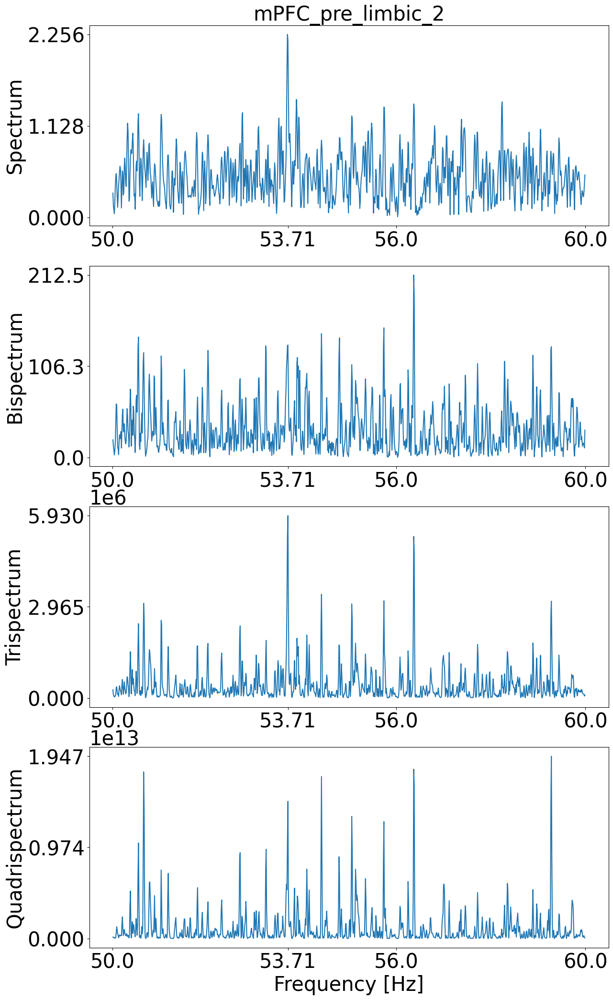

####################################################################################################


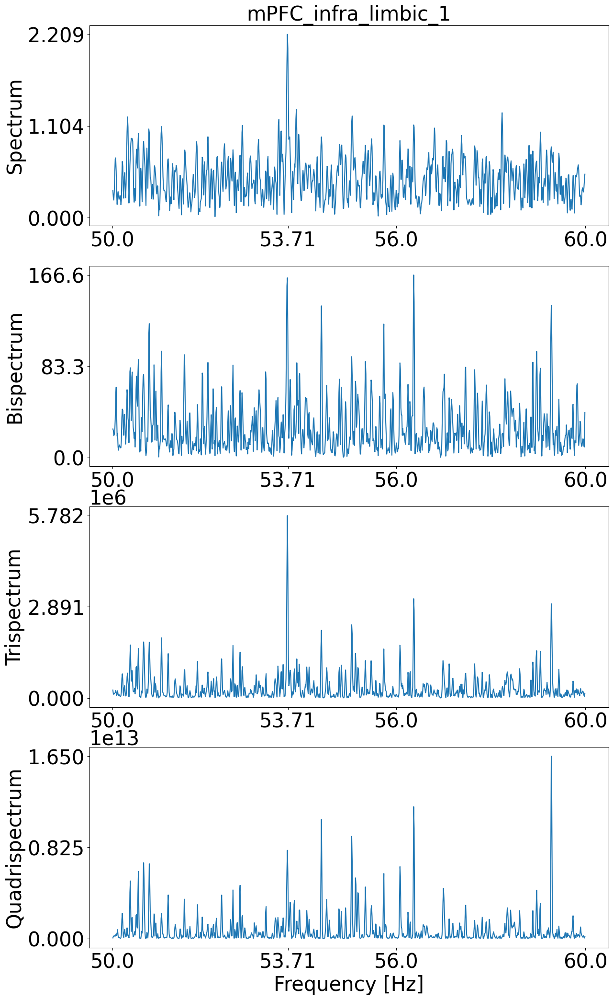

####################################################################################################


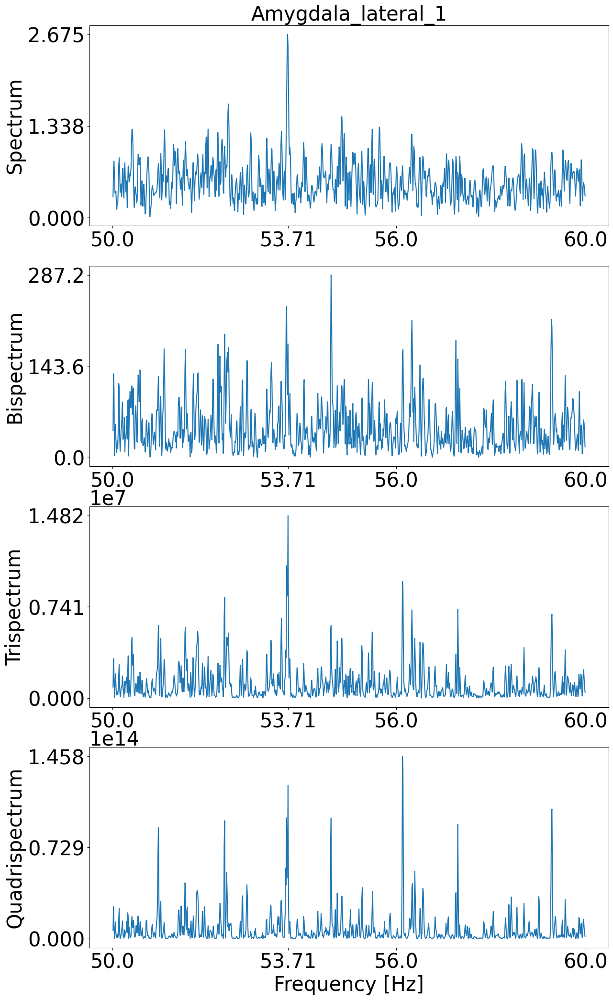

####################################################################################################


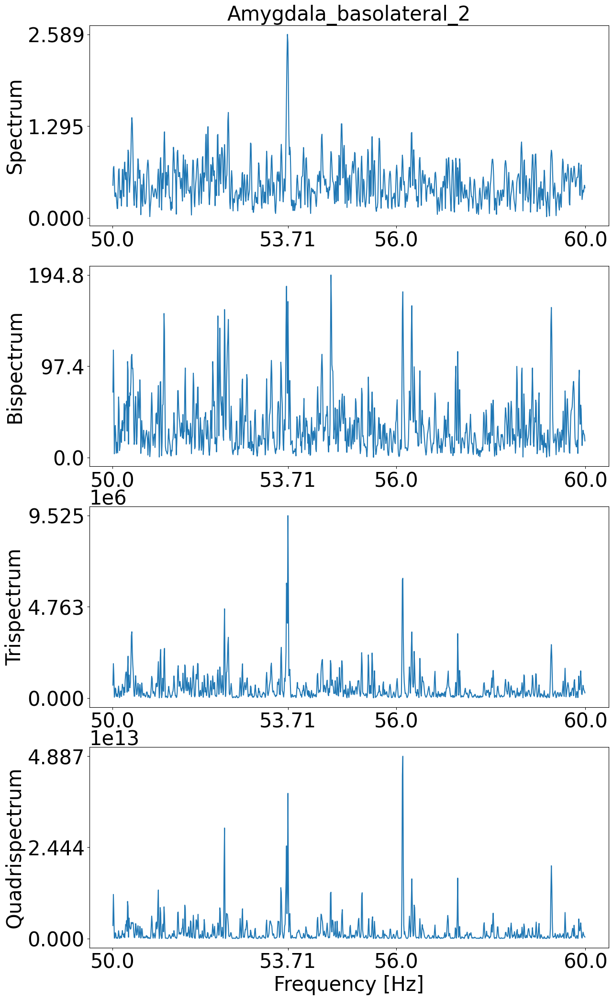

####################################################################################################


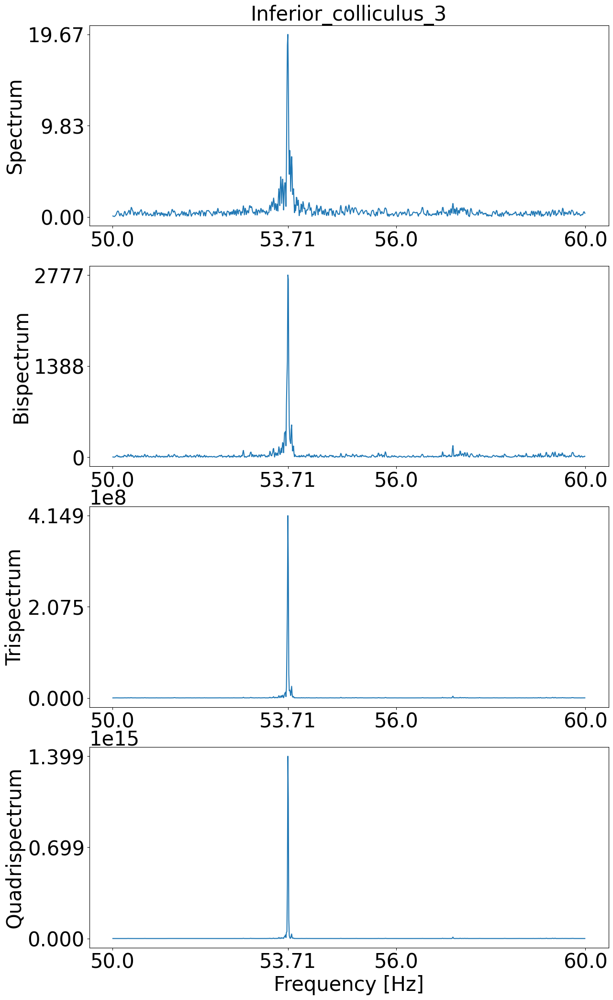

####################################################################################################


In [44]:
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)


freq_array = hosa_df.loc[(hosa_df.frequency>=(lim or [0, 100])[0])&(hosa_df.frequency<=(lim or [0, 100])[1]), "frequency"].to_numpy()

for column in columns[1:]:
    y_spectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tds_amp_{column}"].to_numpy()
    y_bispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdbs_amp_{column}"].to_numpy()
    y_trispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdts_amp_{column}"].to_numpy()
    y_quadrispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdqs_amp_{column}"].to_numpy()

    fig = plt.figure(figsize=(14,25))

    plt.subplot(411)
    plt.title(column)
    plt.plot(freq_array, y_spectrum)
    plt.ylabel("Spectrum")
    y_ticks = np.array([0, y_spectrum.max()/2, y_spectrum.max()])
    plt.yticks(y_ticks)
    plt.xticks(ticks=ticks, labels=labels)

    plt.subplot(412)
    plt.plot(freq_array, y_bispectrum)
    plt.ylabel("Bispectrum")
    y_ticks = np.array([0, y_bispectrum.max()/2, y_bispectrum.max()])
    plt.yticks(y_ticks)
    plt.xticks(ticks=ticks, labels=labels)

    plt.subplot(413)
    plt.plot(freq_array, y_trispectrum)
    plt.ylabel("Trispectrum")
    y_ticks = np.array([0, y_trispectrum.max()/2, y_trispectrum.max()])
    plt.yticks(y_ticks)
    plt.xticks(ticks=ticks, labels=labels)

    plt.subplot(414)
    plt.plot(freq_array, y_quadrispectrum)
    plt.ylabel("Quadrispectrum")
    y_ticks = np.array([0, y_quadrispectrum.max()/2, y_quadrispectrum.max()])
    plt.yticks(y_ticks)
    plt.xticks(ticks=ticks, labels=labels)

    plt.xlabel("Frequency [Hz]")
    
    without_zoom_folder: str = f"{os.getcwd()}/without_zoom"
    if not os.path.exists(without_zoom_folder):
          
        os.makedirs(without_zoom_folder)
    
    if zoom:
        zoom_folder: str = f"with_zoom_{lim[0]}_to_{lim[1]}"
        if not os.path.exists(zoom_folder):

            os.makedirs(zoom_folder)
    else:
        zoom_folder = ""

    event_folder: str = f"{zoom_folder*zoom + 'without_zoom'*(not zoom)}/events"
    
    if not os.path.exists(event_folder):
          
        os.makedirs(event_folder)
    
    plt.savefig(
        f"{zoom_folder*zoom + 'without_zoom'*(not zoom)}/events/hosa_{id_file}_{id_results}_{column}{f'_zoom_{(lim or [None])[0]}_to_{(lim or [None, None])[1]}'*(lim is not None)}.jpg",
        format="jpg",
        bbox_inches='tight', 
        dpi=150
    )

    plt.show()

    print(f"#"*100)

# Selecting Data to model - EVENT 2

In [45]:
event_number = 2
id_results: str = f"event_{event_number}"

event_data = select_event_window(
    df=data_backup, 
    event_name=f"event_{event_number}", 
    samples_before=0, 
    samples_after=0,
    freezing=False
)

In [46]:
path_files = f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv'
load_already_calculated: bool = os.path.isfile(path_files)
if load_already_calculated:
    logger.info("HOSA already calculated. Loading...")
    hosa_df = pd.read_csv(path_files)
    logger.success("HOSA loaded!")

else:
    logger.info("HOSA not calculated yet. Generating hosa...")
    logger.info(f"\nProcessing event {event_number}")

    spectrum_df_amps = pd.DataFrame()
    spectrum_df_phases = pd.DataFrame()

    bispectrum_df_amps = pd.DataFrame()
    bispectrum_df_phases = pd.DataFrame()

    trispectrum_df_amps = pd.DataFrame()
    trispectrum_df_phases = pd.DataFrame()

    quadrispectrum_df_amps = pd.DataFrame()
    quadrispectrum_df_phases = pd.DataFrame()

    hosa_df = pd.DataFrame()

    logger.info("Processing the tdqs... This may take a while...\n")
    start_time = perf_counter()

    # Process the tdbs for each channel, in parallel

    f = lambda x: tdqs_object.run_td4spectrum(x)
    channels_columns = columns[1:]

    with Pool() as pool:

        for result in pool.map(f, [{column: event_data.loc[: , column].to_numpy()} for column in channels_columns]):
            column, result_data = list(result.items())[0]
            (
                frequency_array, 
                spectrum, 
                phase_spectrum, 
                bispectrum, 
                phase_bispectrum, 
                trispectrum, 
                phase_trispectrum, 
                tetraspectrum, 
                phase_tetraspectrum
            ) = result_data

            if (
                "frequency" not in spectrum_df_amps.columns or 
                "frequency" not in bispectrum_df_amps.columns or
                "frequency" not in hosa_df
            ):
                spectrum_df_amps = spectrum_df_amps.assign(frequency=frequency_array)
                bispectrum_df_amps = bispectrum_df_amps.assign(frequency=frequency_array)
                hosa_df =hosa_df.assign(frequency=frequency_array)


            spectrum_df_amps = spectrum_df_amps.assign(**{f"tds_amp_{column}": spectrum})
            spectrum_df_phases = spectrum_df_phases.assign(**{f"tds_phase_{column}": phase_spectrum})

            bispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdbs_amp_{column}": bispectrum})
            bispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdbs_phase_{column}": phase_bispectrum})

            trispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdts_amp_{column}": trispectrum})
            trispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdts_phase_{column}": phase_trispectrum})

            quadrispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdqs_amp_{column}": tetraspectrum})
            quadrispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdqs_phase_{column}": phase_tetraspectrum})

            hosa_df = hosa_df.assign(**{f"tds_amp_{column}": spectrum})
            hosa_df = hosa_df.assign(**{f"tdbs_amp_{column}": bispectrum})
            hosa_df = hosa_df.assign(**{f"tdts_amp_{column}": trispectrum})
            hosa_df = hosa_df.assign(**{f"tdqs_amp_{column}": tetraspectrum})


    spectrum_df = pd.concat([spectrum_df_amps, spectrum_df_phases], axis=1)
    bispectrum_df = pd.concat([bispectrum_df_amps, bispectrum_df_phases], axis=1)
    trispectrum_df = pd.concat([trispectrum_df_amps, trispectrum_df_phases], axis=1)
    quadrispectrum_df = pd.concat([quadrispectrum_df_amps, quadrispectrum_df_phases], axis=1)

    hosa_df.to_csv(f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv', index=False)

    end_time = perf_counter()

    logger.success(f"Done. Elapsed time: {seconds_to_formatted_time(end_time - start_time)}")

2023-09-07 19:39:34.667 | INFO     | __main__:<module>:4 - HOSA already calculated. Loading...
2023-09-07 19:39:34.687 | SUCCESS  | __main__:<module>:6 - HOSA loaded!


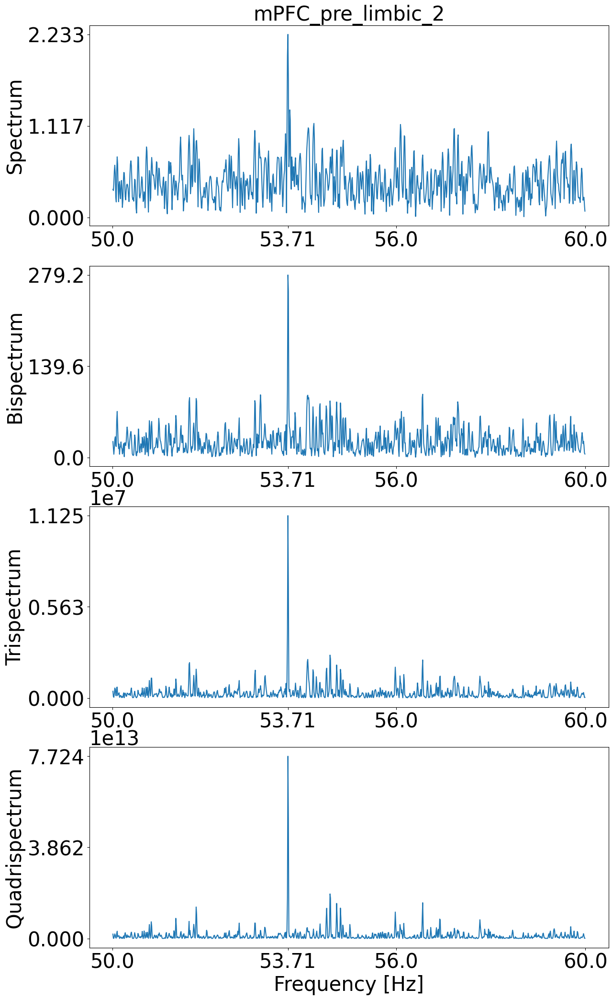

####################################################################################################


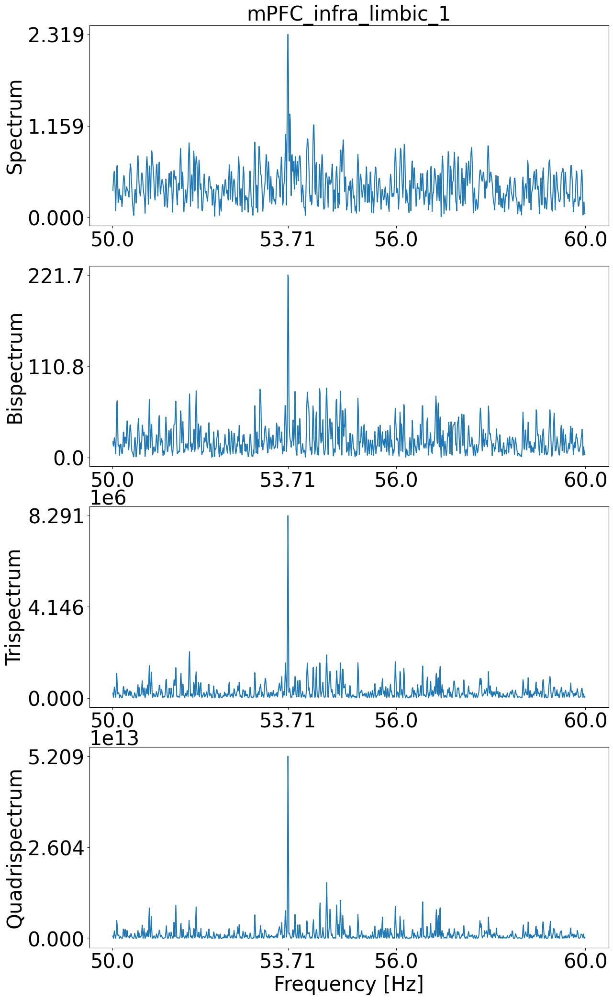

####################################################################################################


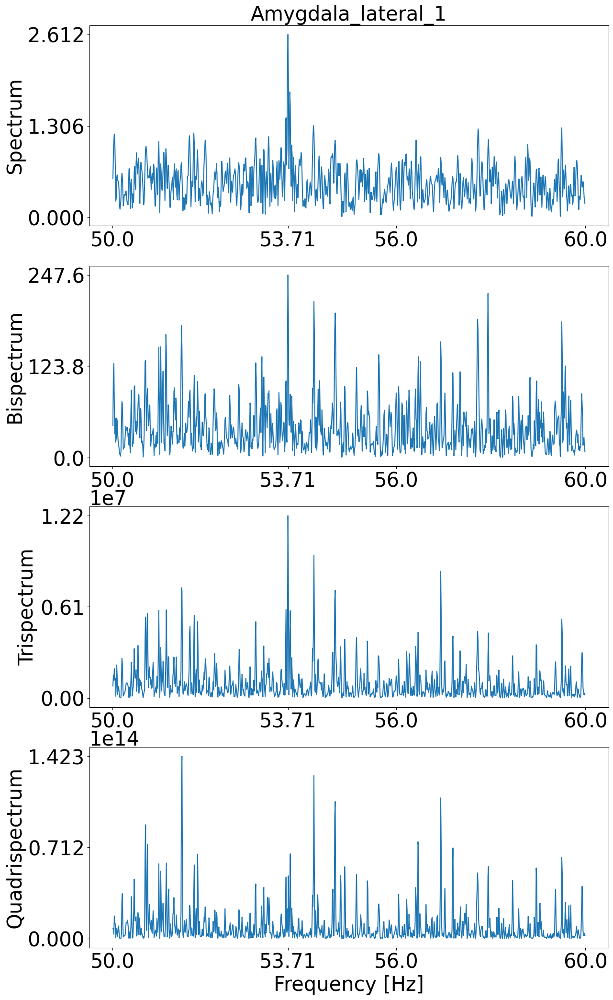

####################################################################################################


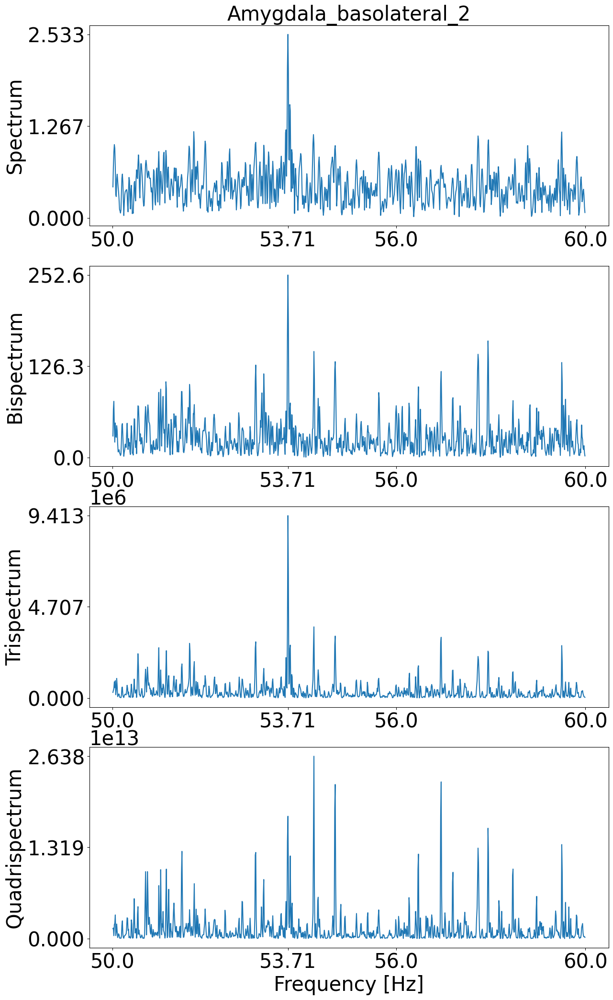

####################################################################################################


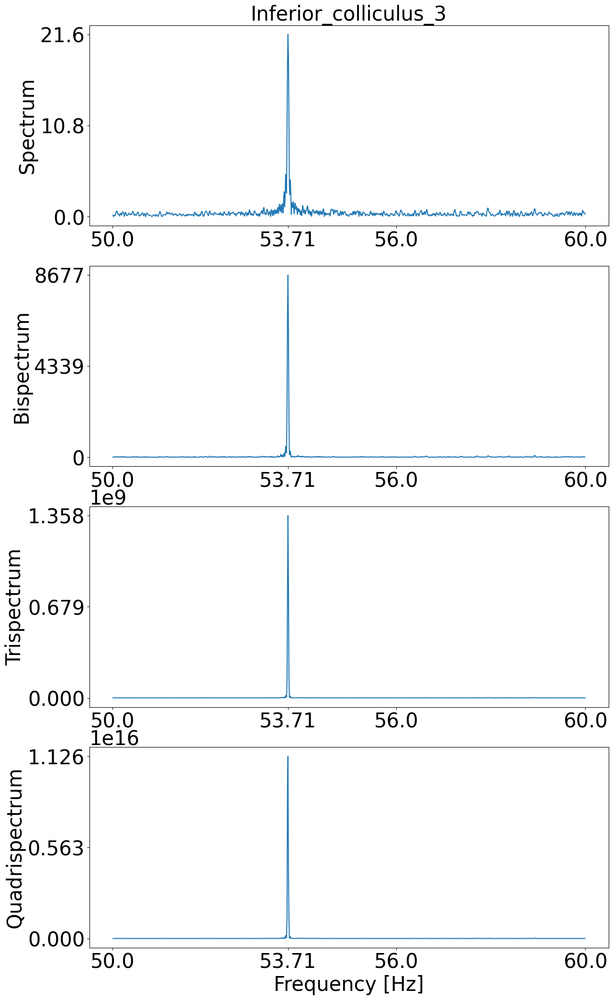

####################################################################################################


In [47]:
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)


freq_array = hosa_df.loc[(hosa_df.frequency>=(lim or [0, 100])[0])&(hosa_df.frequency<=(lim or [0, 100])[1]), "frequency"].to_numpy()

for column in columns[1:]:
    y_spectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tds_amp_{column}"].to_numpy()
    y_bispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdbs_amp_{column}"].to_numpy()
    y_trispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdts_amp_{column}"].to_numpy()
    y_quadrispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdqs_amp_{column}"].to_numpy()

    fig = plt.figure(figsize=(14,25))

    plt.subplot(411)
    plt.title(column)
    plt.plot(freq_array, y_spectrum)
    plt.ylabel("Spectrum")
    y_ticks = np.array([0, y_spectrum.max()/2, y_spectrum.max()])
    plt.yticks(y_ticks)
    plt.xticks(ticks=ticks, labels=labels)

    plt.subplot(412)
    plt.plot(freq_array, y_bispectrum)
    plt.ylabel("Bispectrum")
    y_ticks = np.array([0, y_bispectrum.max()/2, y_bispectrum.max()])
    plt.yticks(y_ticks)
    plt.xticks(ticks=ticks, labels=labels)

    plt.subplot(413)
    plt.plot(freq_array, y_trispectrum)
    plt.ylabel("Trispectrum")
    y_ticks = np.array([0, y_trispectrum.max()/2, y_trispectrum.max()])
    plt.yticks(y_ticks)
    plt.xticks(ticks=ticks, labels=labels)

    plt.subplot(414)
    plt.plot(freq_array, y_quadrispectrum)
    plt.ylabel("Quadrispectrum")
    y_ticks = np.array([0, y_quadrispectrum.max()/2, y_quadrispectrum.max()])
    plt.yticks(y_ticks)
    plt.xticks(ticks=ticks, labels=labels)

    plt.xlabel("Frequency [Hz]")
    
    without_zoom_folder: str = f"{os.getcwd()}/without_zoom"
    if not os.path.exists(without_zoom_folder):
          
        os.makedirs(without_zoom_folder)
    
    if zoom:
        zoom_folder: str = f"with_zoom_{lim[0]}_to_{lim[1]}"
        if not os.path.exists(zoom_folder):

            os.makedirs(zoom_folder)
    else:
        zoom_folder = ""

    event_folder: str = f"{zoom_folder*zoom + 'without_zoom'*(not zoom)}/events"
    
    if not os.path.exists(event_folder):
          
        os.makedirs(event_folder)
    
    plt.savefig(
        f"{zoom_folder*zoom + 'without_zoom'*(not zoom)}/events/hosa_{id_file}_{id_results}_{column}{f'_zoom_{(lim or [None])[0]}_to_{(lim or [None, None])[1]}'*(lim is not None)}.jpg",
        format="jpg",
        bbox_inches='tight', 
        dpi=150
    )

    plt.show()

    print(f"#"*100)

# Selecting Data to model - EVENT 3

In [48]:
event_number = 3
id_results: str = f"event_{event_number}"

event_data = select_event_window(
    df=data_backup, 
    event_name=f"event_{event_number}", 
    samples_before=0, 
    samples_after=0,
    freezing=False
)

In [49]:
path_files = f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv'
load_already_calculated: bool = os.path.isfile(path_files)
if load_already_calculated:
    logger.info("HOSA already calculated. Loading...")
    hosa_df = pd.read_csv(path_files)
    logger.success("HOSA loaded!")

else:
    logger.info("HOSA not calculated yet. Generating hosa...")
    logger.info(f"\nProcessing event {event_number}")

    spectrum_df_amps = pd.DataFrame()
    spectrum_df_phases = pd.DataFrame()

    bispectrum_df_amps = pd.DataFrame()
    bispectrum_df_phases = pd.DataFrame()

    trispectrum_df_amps = pd.DataFrame()
    trispectrum_df_phases = pd.DataFrame()

    quadrispectrum_df_amps = pd.DataFrame()
    quadrispectrum_df_phases = pd.DataFrame()

    hosa_df = pd.DataFrame()

    logger.info("Processing the tdqs... This may take a while...\n")
    start_time = perf_counter()

    # Process the tdbs for each channel, in parallel

    f = lambda x: tdqs_object.run_td4spectrum(x)
    channels_columns = columns[1:]

    with Pool() as pool:

        for result in pool.map(f, [{column: event_data.loc[: , column].to_numpy()} for column in channels_columns]):
            column, result_data = list(result.items())[0]
            (
                frequency_array, 
                spectrum, 
                phase_spectrum, 
                bispectrum, 
                phase_bispectrum, 
                trispectrum, 
                phase_trispectrum, 
                tetraspectrum, 
                phase_tetraspectrum
            ) = result_data

            if (
                "frequency" not in spectrum_df_amps.columns or 
                "frequency" not in bispectrum_df_amps.columns or
                "frequency" not in hosa_df
            ):
                spectrum_df_amps = spectrum_df_amps.assign(frequency=frequency_array)
                bispectrum_df_amps = bispectrum_df_amps.assign(frequency=frequency_array)
                hosa_df =hosa_df.assign(frequency=frequency_array)


            spectrum_df_amps = spectrum_df_amps.assign(**{f"tds_amp_{column}": spectrum})
            spectrum_df_phases = spectrum_df_phases.assign(**{f"tds_phase_{column}": phase_spectrum})

            bispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdbs_amp_{column}": bispectrum})
            bispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdbs_phase_{column}": phase_bispectrum})

            trispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdts_amp_{column}": trispectrum})
            trispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdts_phase_{column}": phase_trispectrum})

            quadrispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdqs_amp_{column}": tetraspectrum})
            quadrispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdqs_phase_{column}": phase_tetraspectrum})

            hosa_df = hosa_df.assign(**{f"tds_amp_{column}": spectrum})
            hosa_df = hosa_df.assign(**{f"tdbs_amp_{column}": bispectrum})
            hosa_df = hosa_df.assign(**{f"tdts_amp_{column}": trispectrum})
            hosa_df = hosa_df.assign(**{f"tdqs_amp_{column}": tetraspectrum})


    spectrum_df = pd.concat([spectrum_df_amps, spectrum_df_phases], axis=1)
    bispectrum_df = pd.concat([bispectrum_df_amps, bispectrum_df_phases], axis=1)
    trispectrum_df = pd.concat([trispectrum_df_amps, trispectrum_df_phases], axis=1)
    quadrispectrum_df = pd.concat([quadrispectrum_df_amps, quadrispectrum_df_phases], axis=1)

    hosa_df.to_csv(f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv', index=False)

    end_time = perf_counter()

    logger.success(f"Done. Elapsed time: {seconds_to_formatted_time(end_time - start_time)}")

2023-09-07 19:39:37.725 | INFO     | __main__:<module>:4 - HOSA already calculated. Loading...
2023-09-07 19:39:37.744 | SUCCESS  | __main__:<module>:6 - HOSA loaded!


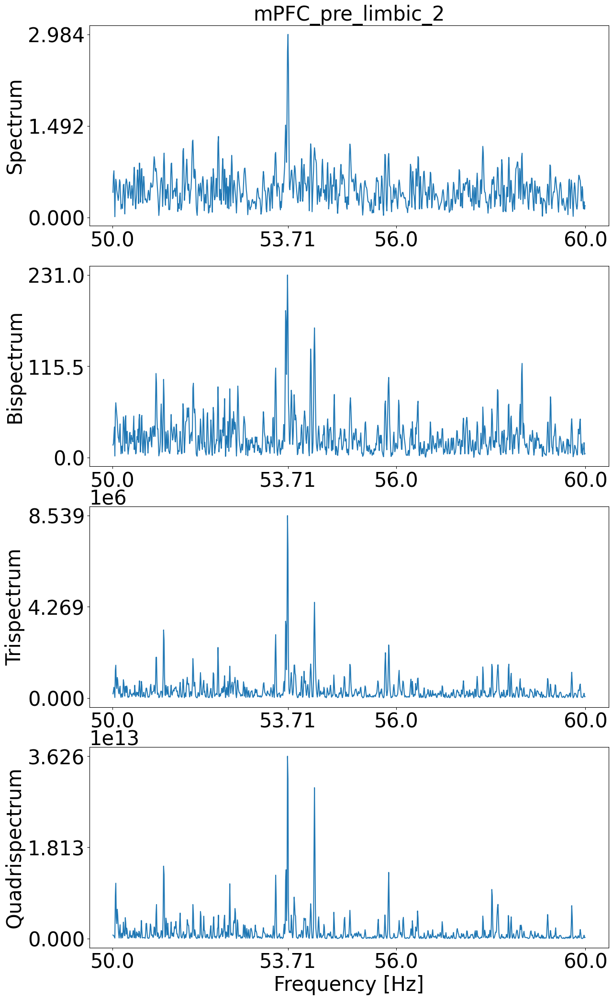

####################################################################################################


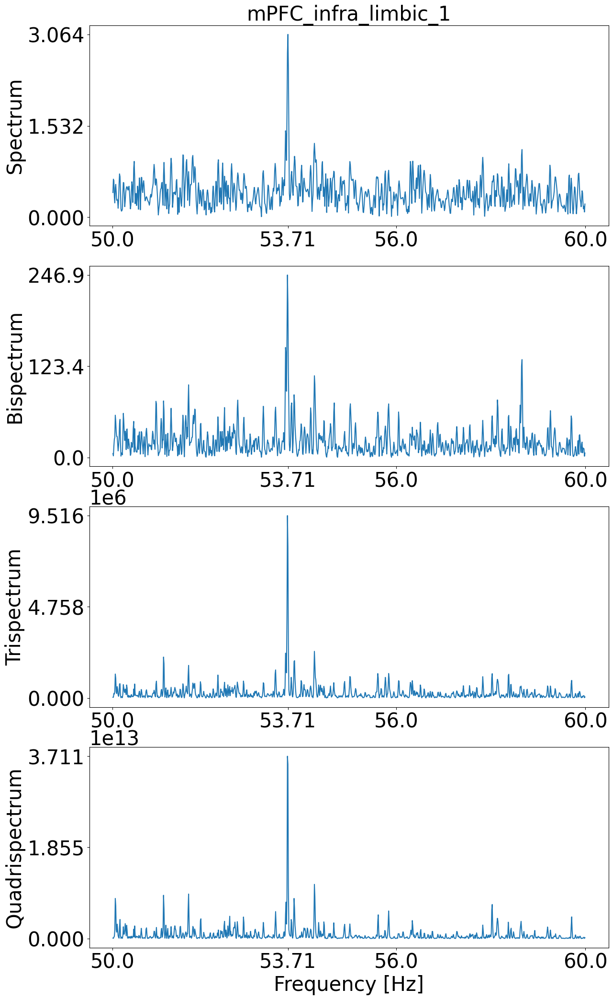

####################################################################################################


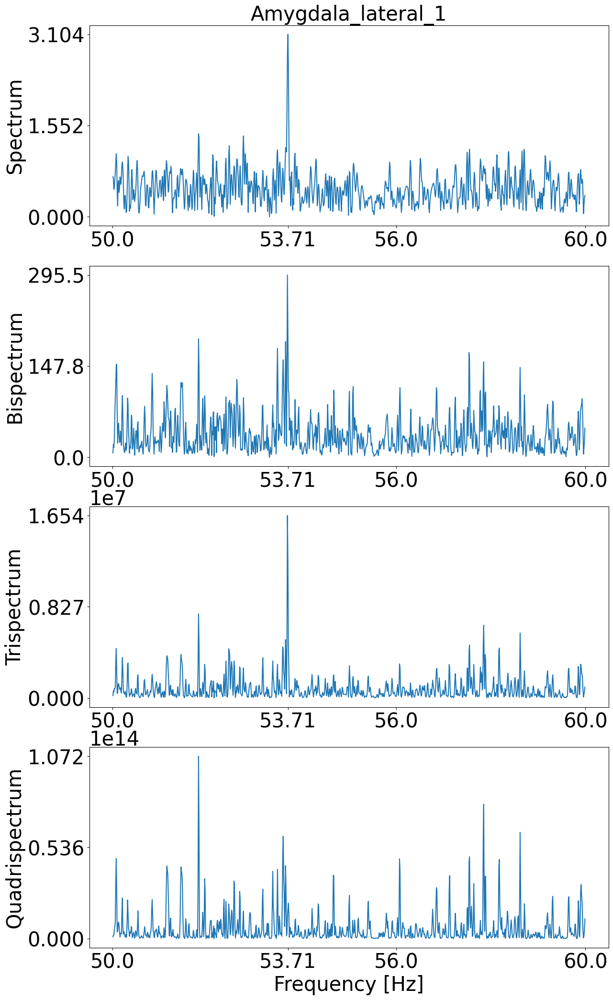

####################################################################################################


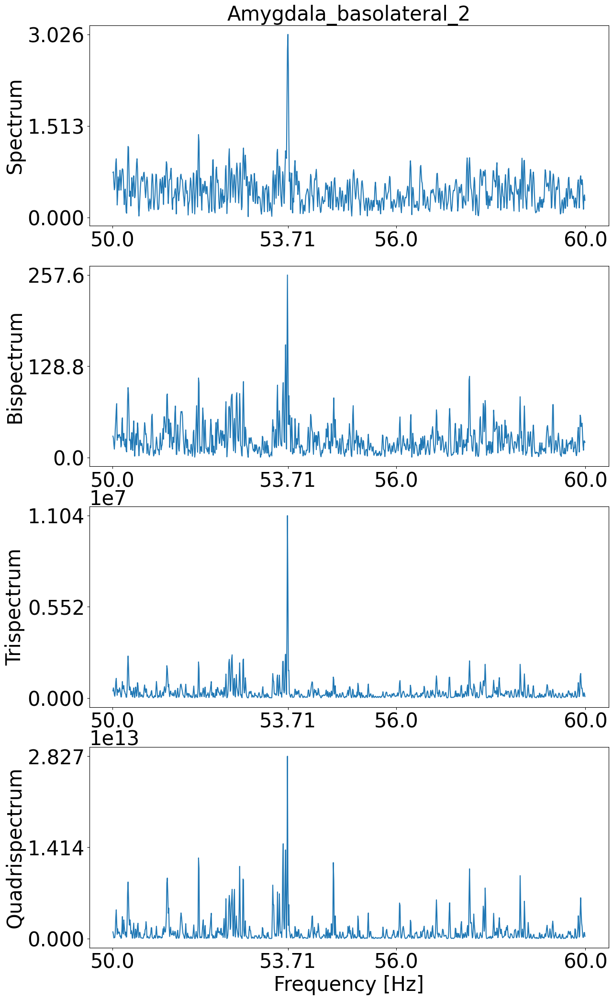

####################################################################################################


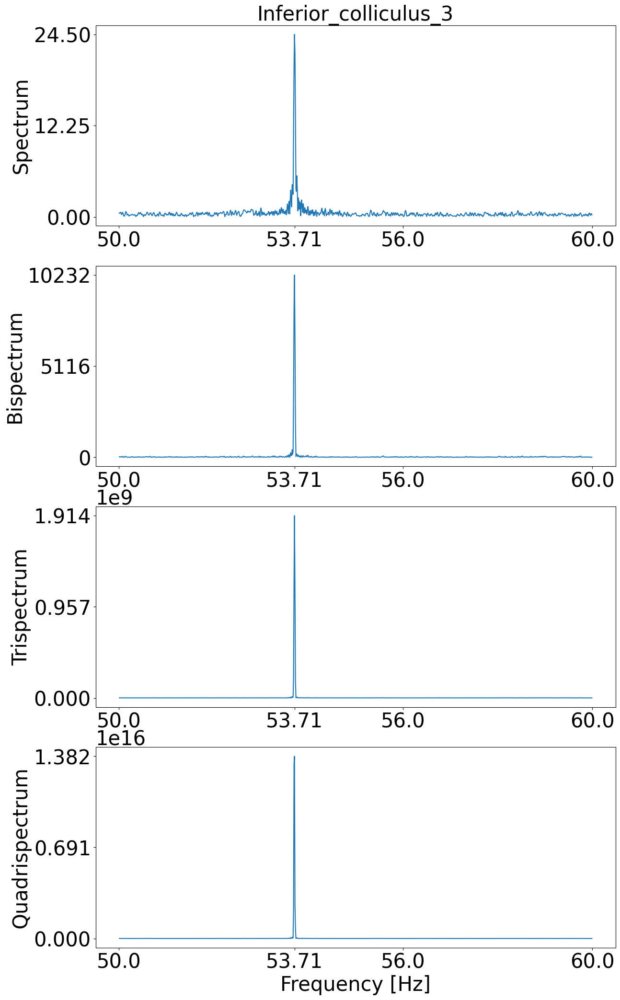

####################################################################################################


In [50]:
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)


freq_array = hosa_df.loc[(hosa_df.frequency>=(lim or [0, 100])[0])&(hosa_df.frequency<=(lim or [0, 100])[1]), "frequency"].to_numpy()

for column in columns[1:]:
    y_spectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tds_amp_{column}"].to_numpy()
    y_bispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdbs_amp_{column}"].to_numpy()
    y_trispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdts_amp_{column}"].to_numpy()
    y_quadrispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdqs_amp_{column}"].to_numpy()

    fig = plt.figure(figsize=(14,25))

    plt.subplot(411)
    plt.title(column)
    plt.plot(freq_array, y_spectrum)
    plt.ylabel("Spectrum")
    y_ticks = np.array([0, y_spectrum.max()/2, y_spectrum.max()])
    plt.yticks(y_ticks)
    plt.xticks(ticks=ticks, labels=labels)

    plt.subplot(412)
    plt.plot(freq_array, y_bispectrum)
    plt.ylabel("Bispectrum")
    y_ticks = np.array([0, y_bispectrum.max()/2, y_bispectrum.max()])
    plt.yticks(y_ticks)
    plt.xticks(ticks=ticks, labels=labels)

    plt.subplot(413)
    plt.plot(freq_array, y_trispectrum)
    plt.ylabel("Trispectrum")
    y_ticks = np.array([0, y_trispectrum.max()/2, y_trispectrum.max()])
    plt.yticks(y_ticks)
    plt.xticks(ticks=ticks, labels=labels)

    plt.subplot(414)
    plt.plot(freq_array, y_quadrispectrum)
    plt.ylabel("Quadrispectrum")
    y_ticks = np.array([0, y_quadrispectrum.max()/2, y_quadrispectrum.max()])
    plt.yticks(y_ticks)
    plt.xticks(ticks=ticks, labels=labels)

    plt.xlabel("Frequency [Hz]")
    
    without_zoom_folder: str = f"{os.getcwd()}/without_zoom"
    if not os.path.exists(without_zoom_folder):
          
        os.makedirs(without_zoom_folder)
    
    if zoom:
        zoom_folder: str = f"with_zoom_{lim[0]}_to_{lim[1]}"
        if not os.path.exists(zoom_folder):

            os.makedirs(zoom_folder)
    else:
        zoom_folder = ""

    event_folder: str = f"{zoom_folder*zoom + 'without_zoom'*(not zoom)}/events"
    
    if not os.path.exists(event_folder):
          
        os.makedirs(event_folder)
    
    plt.savefig(
        f"{zoom_folder*zoom + 'without_zoom'*(not zoom)}/events/hosa_{id_file}_{id_results}_{column}{f'_zoom_{(lim or [None])[0]}_to_{(lim or [None, None])[1]}'*(lim is not None)}.jpg",
        format="jpg",
        bbox_inches='tight', 
        dpi=150
    )

    plt.show()

    print(f"#"*100)

# Selecting Data to model - EVENT 4

In [51]:
event_number = 4
id_results: str = f"event_{event_number}"

event_data = select_event_window(
    df=data_backup, 
    event_name=f"event_{event_number}", 
    samples_before=0, 
    samples_after=0,
    freezing=False
)

In [52]:
path_files = f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv'
load_already_calculated: bool = os.path.isfile(path_files)
if load_already_calculated:
    logger.info("HOSA already calculated. Loading...")
    hosa_df = pd.read_csv(path_files)
    logger.success("HOSA loaded!")

else:
    logger.info("HOSA not calculated yet. Generating hosa...")
    logger.info(f"\nProcessing event {event_number}")

    spectrum_df_amps = pd.DataFrame()
    spectrum_df_phases = pd.DataFrame()

    bispectrum_df_amps = pd.DataFrame()
    bispectrum_df_phases = pd.DataFrame()

    trispectrum_df_amps = pd.DataFrame()
    trispectrum_df_phases = pd.DataFrame()

    quadrispectrum_df_amps = pd.DataFrame()
    quadrispectrum_df_phases = pd.DataFrame()

    hosa_df = pd.DataFrame()

    logger.info("Processing the tdqs... This may take a while...\n")
    start_time = perf_counter()

    # Process the tdbs for each channel, in parallel

    f = lambda x: tdqs_object.run_td4spectrum(x)
    channels_columns = columns[1:]

    with Pool() as pool:

        for result in pool.map(f, [{column: event_data.loc[: , column].to_numpy()} for column in channels_columns]):
            column, result_data = list(result.items())[0]
            (
                frequency_array, 
                spectrum, 
                phase_spectrum, 
                bispectrum, 
                phase_bispectrum, 
                trispectrum, 
                phase_trispectrum, 
                tetraspectrum, 
                phase_tetraspectrum
            ) = result_data

            if (
                "frequency" not in spectrum_df_amps.columns or 
                "frequency" not in bispectrum_df_amps.columns or
                "frequency" not in hosa_df
            ):
                spectrum_df_amps = spectrum_df_amps.assign(frequency=frequency_array)
                bispectrum_df_amps = bispectrum_df_amps.assign(frequency=frequency_array)
                hosa_df =hosa_df.assign(frequency=frequency_array)


            spectrum_df_amps = spectrum_df_amps.assign(**{f"tds_amp_{column}": spectrum})
            spectrum_df_phases = spectrum_df_phases.assign(**{f"tds_phase_{column}": phase_spectrum})

            bispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdbs_amp_{column}": bispectrum})
            bispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdbs_phase_{column}": phase_bispectrum})

            trispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdts_amp_{column}": trispectrum})
            trispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdts_phase_{column}": phase_trispectrum})

            quadrispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdqs_amp_{column}": tetraspectrum})
            quadrispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdqs_phase_{column}": phase_tetraspectrum})

            hosa_df = hosa_df.assign(**{f"tds_amp_{column}": spectrum})
            hosa_df = hosa_df.assign(**{f"tdbs_amp_{column}": bispectrum})
            hosa_df = hosa_df.assign(**{f"tdts_amp_{column}": trispectrum})
            hosa_df = hosa_df.assign(**{f"tdqs_amp_{column}": tetraspectrum})


    spectrum_df = pd.concat([spectrum_df_amps, spectrum_df_phases], axis=1)
    bispectrum_df = pd.concat([bispectrum_df_amps, bispectrum_df_phases], axis=1)
    trispectrum_df = pd.concat([trispectrum_df_amps, trispectrum_df_phases], axis=1)
    quadrispectrum_df = pd.concat([quadrispectrum_df_amps, quadrispectrum_df_phases], axis=1)

    hosa_df.to_csv(f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv', index=False)

    end_time = perf_counter()

    logger.success(f"Done. Elapsed time: {seconds_to_formatted_time(end_time - start_time)}")

2023-09-07 19:39:40.694 | INFO     | __main__:<module>:4 - HOSA already calculated. Loading...
2023-09-07 19:39:40.715 | SUCCESS  | __main__:<module>:6 - HOSA loaded!


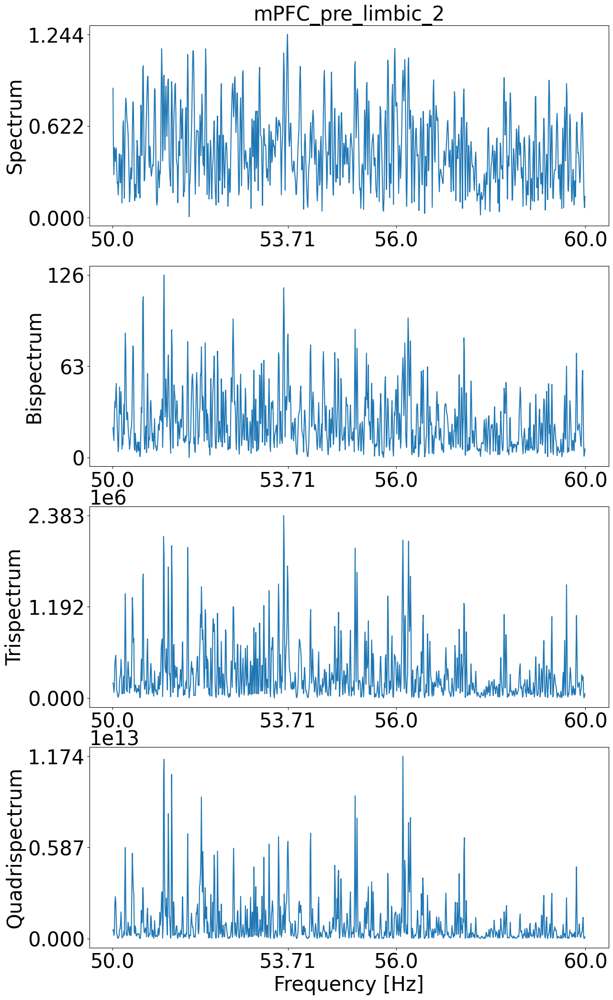

####################################################################################################


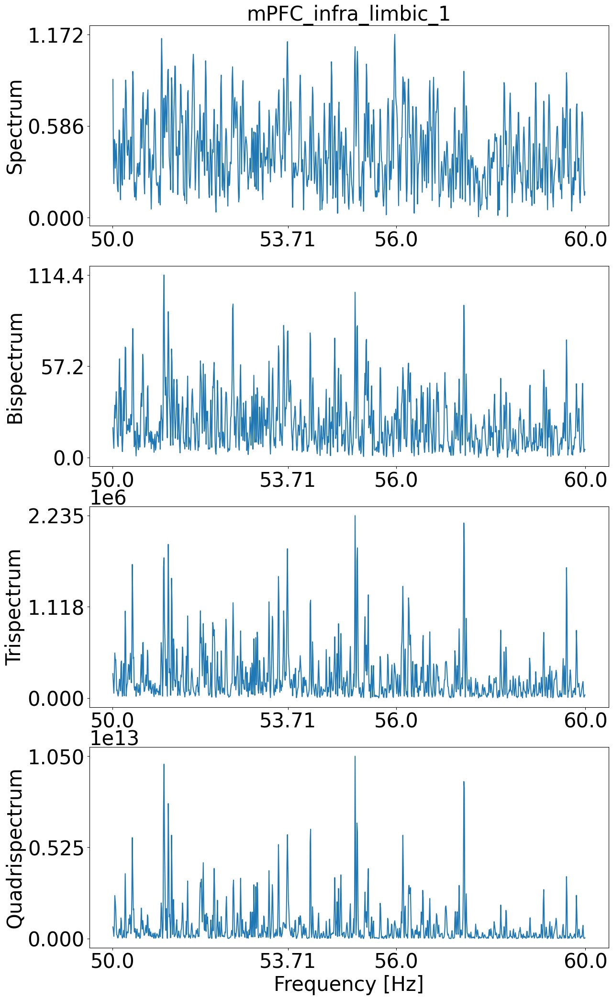

####################################################################################################


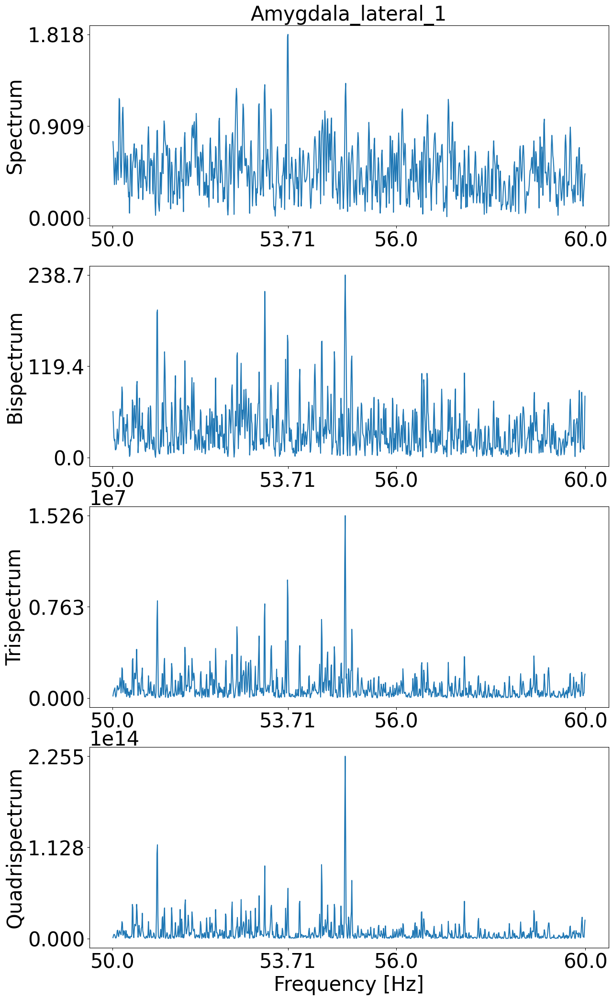

####################################################################################################


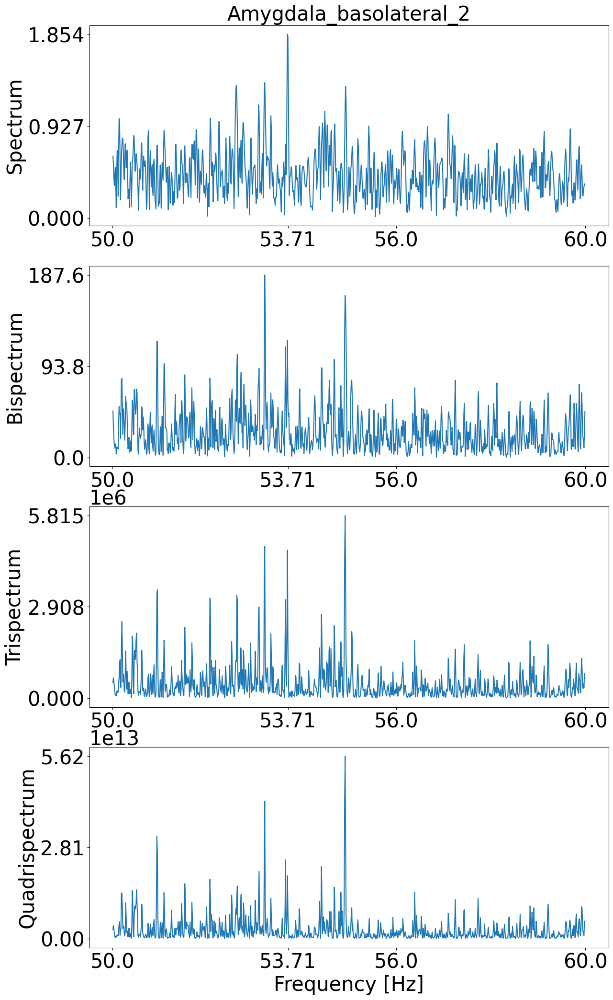

####################################################################################################


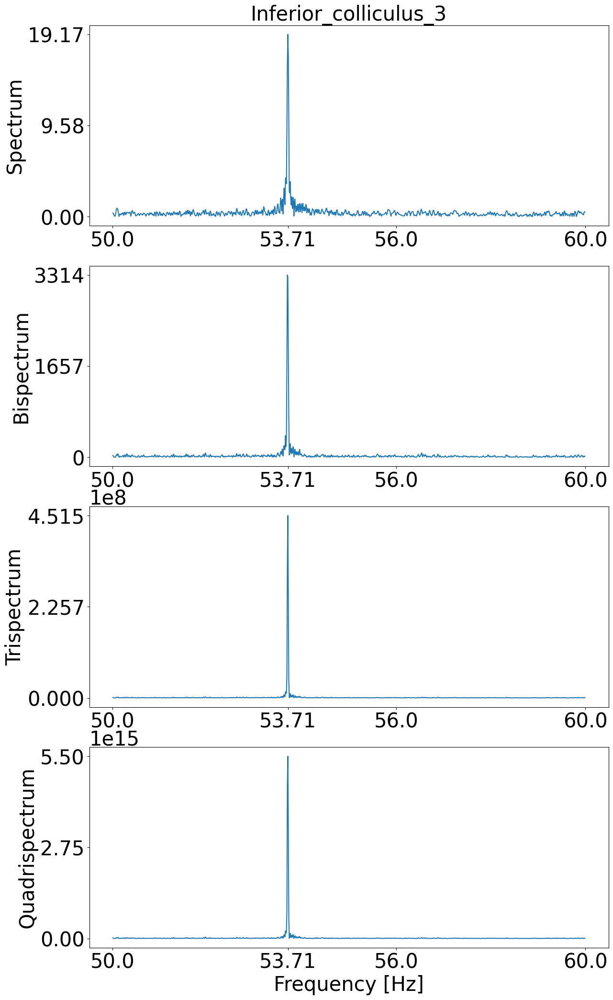

####################################################################################################


In [53]:
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)


freq_array = hosa_df.loc[(hosa_df.frequency>=(lim or [0, 100])[0])&(hosa_df.frequency<=(lim or [0, 100])[1]), "frequency"].to_numpy()

for column in columns[1:]:
    y_spectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tds_amp_{column}"].to_numpy()
    y_bispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdbs_amp_{column}"].to_numpy()
    y_trispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdts_amp_{column}"].to_numpy()
    y_quadrispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdqs_amp_{column}"].to_numpy()

    fig = plt.figure(figsize=(14,25))

    plt.subplot(411)
    plt.title(column)
    plt.plot(freq_array, y_spectrum)
    plt.ylabel("Spectrum")
    y_ticks = np.array([0, y_spectrum.max()/2, y_spectrum.max()])
    plt.yticks(y_ticks)
    plt.xticks(ticks=ticks, labels=labels)

    plt.subplot(412)
    plt.plot(freq_array, y_bispectrum)
    plt.ylabel("Bispectrum")
    y_ticks = np.array([0, y_bispectrum.max()/2, y_bispectrum.max()])
    plt.yticks(y_ticks)
    plt.xticks(ticks=ticks, labels=labels)

    plt.subplot(413)
    plt.plot(freq_array, y_trispectrum)
    plt.ylabel("Trispectrum")
    y_ticks = np.array([0, y_trispectrum.max()/2, y_trispectrum.max()])
    plt.yticks(y_ticks)
    plt.xticks(ticks=ticks, labels=labels)

    plt.subplot(414)
    plt.plot(freq_array, y_quadrispectrum)
    plt.ylabel("Quadrispectrum")
    y_ticks = np.array([0, y_quadrispectrum.max()/2, y_quadrispectrum.max()])
    plt.yticks(y_ticks)
    plt.xticks(ticks=ticks, labels=labels)

    plt.xlabel("Frequency [Hz]")
    
    without_zoom_folder: str = f"{os.getcwd()}/without_zoom"
    if not os.path.exists(without_zoom_folder):
          
        os.makedirs(without_zoom_folder)
    
    if zoom:
        zoom_folder: str = f"with_zoom_{lim[0]}_to_{lim[1]}"
        if not os.path.exists(zoom_folder):

            os.makedirs(zoom_folder)
    else:
        zoom_folder = ""

    event_folder: str = f"{zoom_folder*zoom + 'without_zoom'*(not zoom)}/events"
    
    if not os.path.exists(event_folder):
          
        os.makedirs(event_folder)
    
    plt.savefig(
        f"{zoom_folder*zoom + 'without_zoom'*(not zoom)}/events/hosa_{id_file}_{id_results}_{column}{f'_zoom_{(lim or [None])[0]}_to_{(lim or [None, None])[1]}'*(lim is not None)}.jpg",
        format="jpg",
        bbox_inches='tight', 
        dpi=150
    )

    plt.show()

    print(f"#"*100)

# Selecting Data to model - EVENT 5

In [54]:
event_number = 5
id_results: str = f"event_{event_number}"

event_data = select_event_window(
    df=data_backup, 
    event_name=f"event_{event_number}", 
    samples_before=0, 
    samples_after=0,
    freezing=False
)

In [55]:
path_files = f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv'
load_already_calculated: bool = os.path.isfile(path_files)
if load_already_calculated:
    logger.info("HOSA already calculated. Loading...")
    hosa_df = pd.read_csv(path_files)
    logger.success("HOSA loaded!")

else:
    logger.info("HOSA not calculated yet. Generating hosa...")
    logger.info(f"\nProcessing event {event_number}")

    spectrum_df_amps = pd.DataFrame()
    spectrum_df_phases = pd.DataFrame()

    bispectrum_df_amps = pd.DataFrame()
    bispectrum_df_phases = pd.DataFrame()

    trispectrum_df_amps = pd.DataFrame()
    trispectrum_df_phases = pd.DataFrame()

    quadrispectrum_df_amps = pd.DataFrame()
    quadrispectrum_df_phases = pd.DataFrame()

    hosa_df = pd.DataFrame()

    logger.info("Processing the tdqs... This may take a while...\n")
    start_time = perf_counter()

    # Process the tdbs for each channel, in parallel

    f = lambda x: tdqs_object.run_td4spectrum(x)
    channels_columns = columns[1:]

    with Pool() as pool:

        for result in pool.map(f, [{column: event_data.loc[: , column].to_numpy()} for column in channels_columns]):
            column, result_data = list(result.items())[0]
            (
                frequency_array, 
                spectrum, 
                phase_spectrum, 
                bispectrum, 
                phase_bispectrum, 
                trispectrum, 
                phase_trispectrum, 
                tetraspectrum, 
                phase_tetraspectrum
            ) = result_data

            if (
                "frequency" not in spectrum_df_amps.columns or 
                "frequency" not in bispectrum_df_amps.columns or
                "frequency" not in hosa_df
            ):
                spectrum_df_amps = spectrum_df_amps.assign(frequency=frequency_array)
                bispectrum_df_amps = bispectrum_df_amps.assign(frequency=frequency_array)
                hosa_df =hosa_df.assign(frequency=frequency_array)


            spectrum_df_amps = spectrum_df_amps.assign(**{f"tds_amp_{column}": spectrum})
            spectrum_df_phases = spectrum_df_phases.assign(**{f"tds_phase_{column}": phase_spectrum})

            bispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdbs_amp_{column}": bispectrum})
            bispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdbs_phase_{column}": phase_bispectrum})

            trispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdts_amp_{column}": trispectrum})
            trispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdts_phase_{column}": phase_trispectrum})

            quadrispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdqs_amp_{column}": tetraspectrum})
            quadrispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdqs_phase_{column}": phase_tetraspectrum})

            hosa_df = hosa_df.assign(**{f"tds_amp_{column}": spectrum})
            hosa_df = hosa_df.assign(**{f"tdbs_amp_{column}": bispectrum})
            hosa_df = hosa_df.assign(**{f"tdts_amp_{column}": trispectrum})
            hosa_df = hosa_df.assign(**{f"tdqs_amp_{column}": tetraspectrum})


    spectrum_df = pd.concat([spectrum_df_amps, spectrum_df_phases], axis=1)
    bispectrum_df = pd.concat([bispectrum_df_amps, bispectrum_df_phases], axis=1)
    trispectrum_df = pd.concat([trispectrum_df_amps, trispectrum_df_phases], axis=1)
    quadrispectrum_df = pd.concat([quadrispectrum_df_amps, quadrispectrum_df_phases], axis=1)

    hosa_df.to_csv(f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv', index=False)

    end_time = perf_counter()

    logger.success(f"Done. Elapsed time: {seconds_to_formatted_time(end_time - start_time)}")

2023-09-07 19:39:43.960 | INFO     | __main__:<module>:4 - HOSA already calculated. Loading...
2023-09-07 19:39:43.980 | SUCCESS  | __main__:<module>:6 - HOSA loaded!


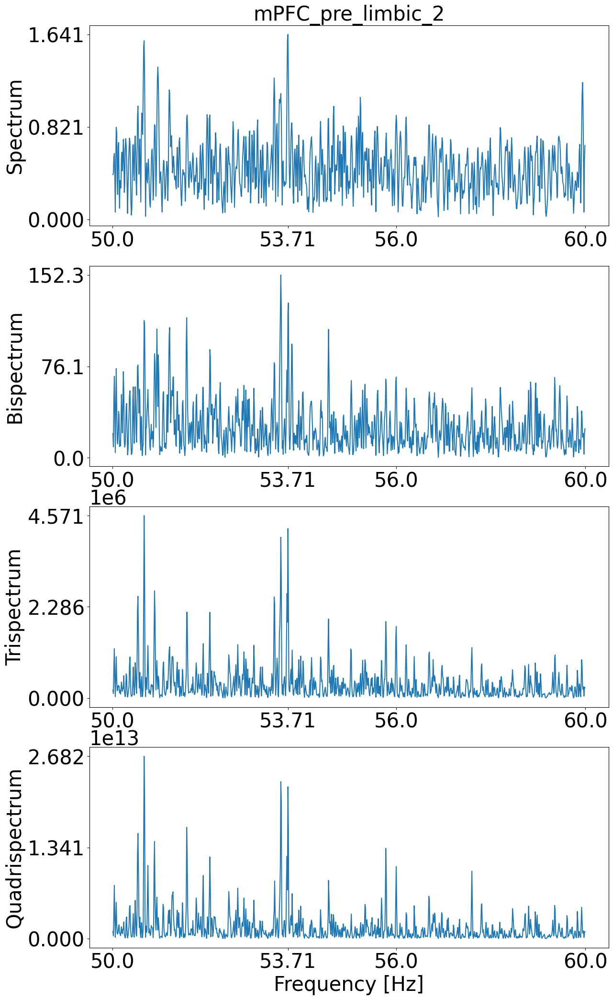

####################################################################################################


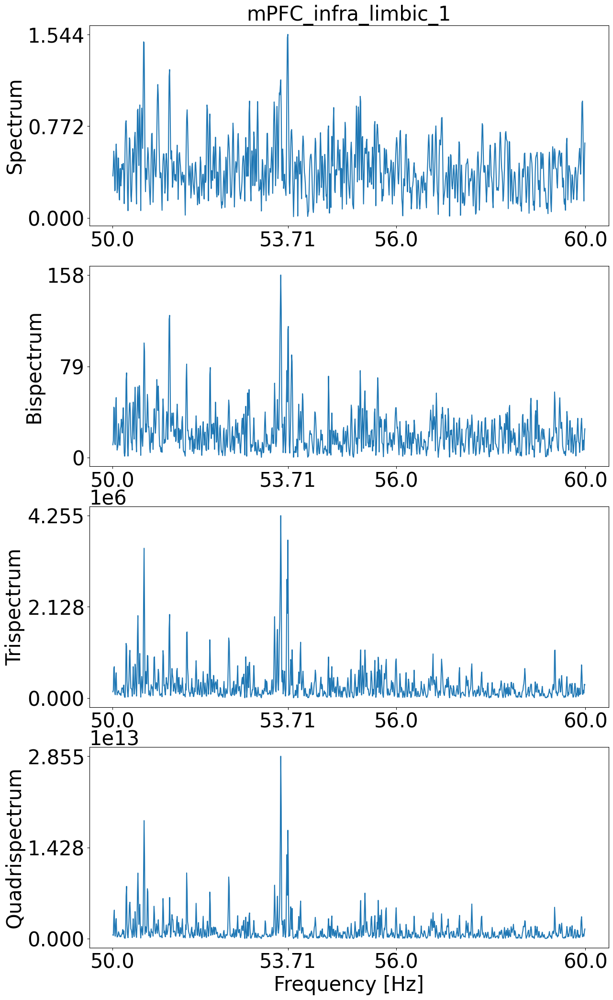

####################################################################################################


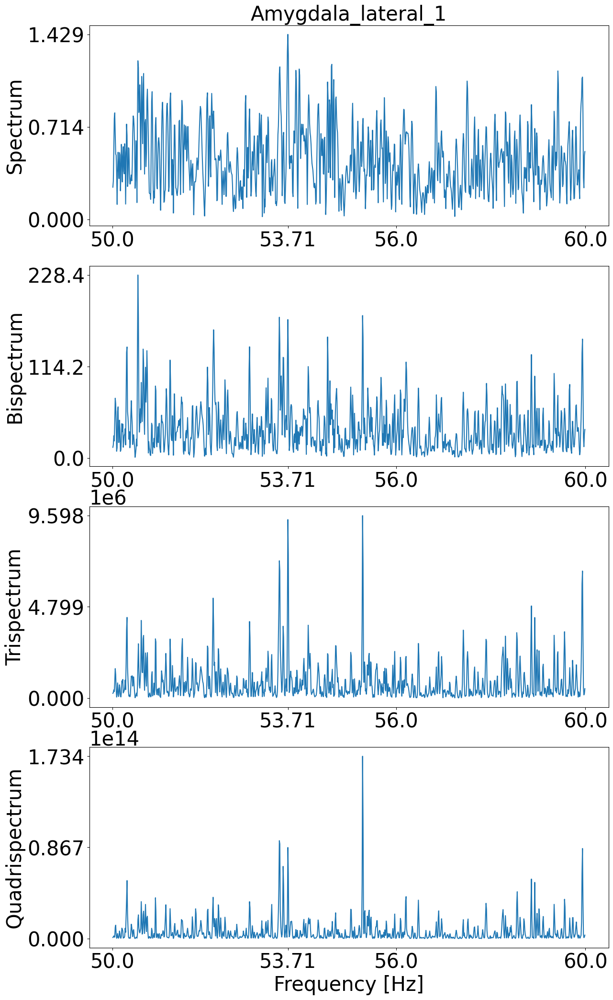

####################################################################################################


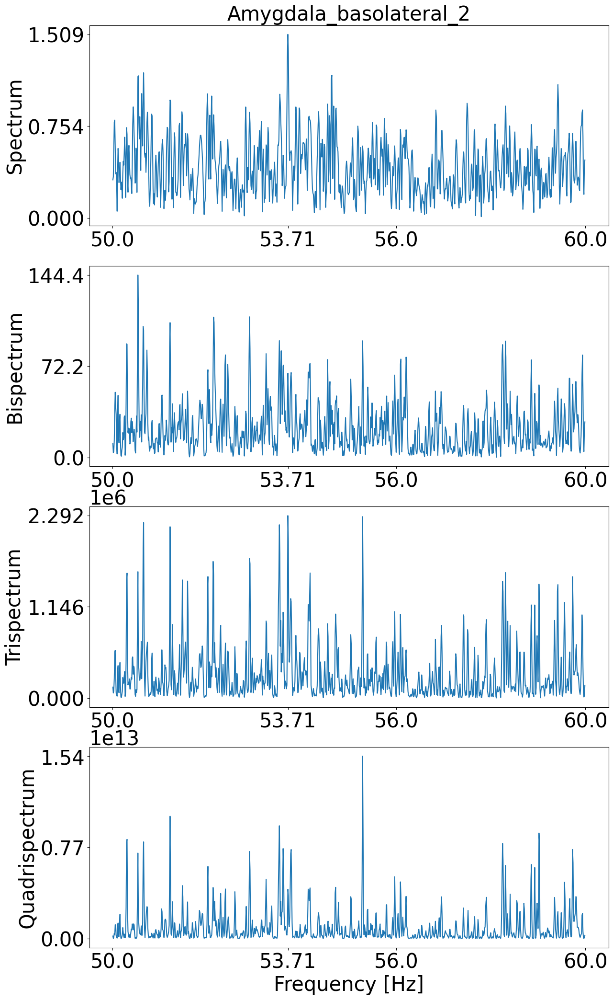

####################################################################################################


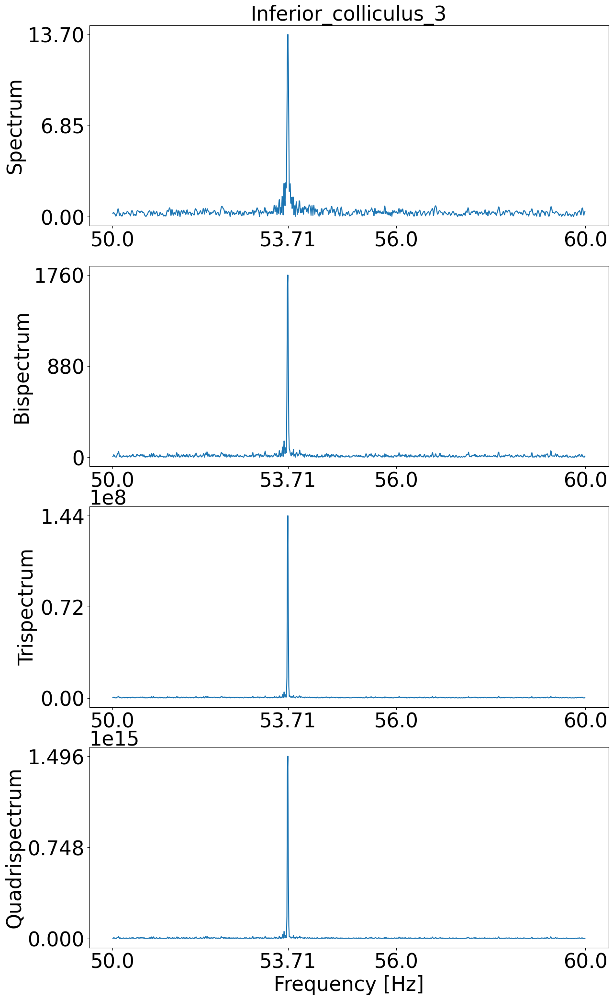

####################################################################################################


In [56]:
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)


freq_array = hosa_df.loc[(hosa_df.frequency>=(lim or [0, 100])[0])&(hosa_df.frequency<=(lim or [0, 100])[1]), "frequency"].to_numpy()

for column in columns[1:]:
    y_spectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tds_amp_{column}"].to_numpy()
    y_bispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdbs_amp_{column}"].to_numpy()
    y_trispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdts_amp_{column}"].to_numpy()
    y_quadrispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdqs_amp_{column}"].to_numpy()

    fig = plt.figure(figsize=(14,25))

    plt.subplot(411)
    plt.title(column)
    plt.plot(freq_array, y_spectrum)
    plt.ylabel("Spectrum")
    y_ticks = np.array([0, y_spectrum.max()/2, y_spectrum.max()])
    plt.yticks(y_ticks)
    plt.xticks(ticks=ticks, labels=labels)

    plt.subplot(412)
    plt.plot(freq_array, y_bispectrum)
    plt.ylabel("Bispectrum")
    y_ticks = np.array([0, y_bispectrum.max()/2, y_bispectrum.max()])
    plt.yticks(y_ticks)
    plt.xticks(ticks=ticks, labels=labels)

    plt.subplot(413)
    plt.plot(freq_array, y_trispectrum)
    plt.ylabel("Trispectrum")
    y_ticks = np.array([0, y_trispectrum.max()/2, y_trispectrum.max()])
    plt.yticks(y_ticks)
    plt.xticks(ticks=ticks, labels=labels)

    plt.subplot(414)
    plt.plot(freq_array, y_quadrispectrum)
    plt.ylabel("Quadrispectrum")
    y_ticks = np.array([0, y_quadrispectrum.max()/2, y_quadrispectrum.max()])
    plt.yticks(y_ticks)
    plt.xticks(ticks=ticks, labels=labels)

    plt.xlabel("Frequency [Hz]")
    
    without_zoom_folder: str = f"{os.getcwd()}/without_zoom"
    if not os.path.exists(without_zoom_folder):
          
        os.makedirs(without_zoom_folder)
    
    if zoom:
        zoom_folder: str = f"with_zoom_{lim[0]}_to_{lim[1]}"
        if not os.path.exists(zoom_folder):

            os.makedirs(zoom_folder)
    else:
        zoom_folder = ""

    event_folder: str = f"{zoom_folder*zoom + 'without_zoom'*(not zoom)}/events"
    
    if not os.path.exists(event_folder):
          
        os.makedirs(event_folder)
    
    plt.savefig(
        f"{zoom_folder*zoom + 'without_zoom'*(not zoom)}/events/hosa_{id_file}_{id_results}_{column}{f'_zoom_{(lim or [None])[0]}_to_{(lim or [None, None])[1]}'*(lim is not None)}.jpg",
        format="jpg",
        bbox_inches='tight', 
        dpi=150
    )

    plt.show()

    print(f"#"*100)

# Average TDHOSA

In [87]:
hosa_df: pd.DataFrame = pd.DataFrame()

for event_number in range(1, 5+1):
    id_results: str = f"event_{event_number}"
    path_files = f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv'
    file_exists: bool = os.path.isfile(path_files)
    if not file_exists:
        raise FileNotFoundError(f"File {f'hosa_{id_file}_{id_results}.csv'} do not exists.")
    current_hosa_df = pd.read_csv(path_files)
    logger.success(f"HOSA loaded! {f'hosa_{id_file}_{id_results}.csv'}")

    hosa_df = pd.concat([hosa_df, current_hosa_df], axis=0)

2023-09-07 20:00:50.430 | SUCCESS  | __main__:<module>:10 - HOSA loaded! hosa_test_freezing_event_1.csv
2023-09-07 20:00:50.445 | SUCCESS  | __main__:<module>:10 - HOSA loaded! hosa_test_freezing_event_2.csv
2023-09-07 20:00:50.461 | SUCCESS  | __main__:<module>:10 - HOSA loaded! hosa_test_freezing_event_3.csv
2023-09-07 20:00:50.478 | SUCCESS  | __main__:<module>:10 - HOSA loaded! hosa_test_freezing_event_4.csv
2023-09-07 20:00:50.504 | SUCCESS  | __main__:<module>:10 - HOSA loaded! hosa_test_freezing_event_5.csv


In [88]:
hosa_df = hosa_df.groupby('frequency').mean().reset_index()

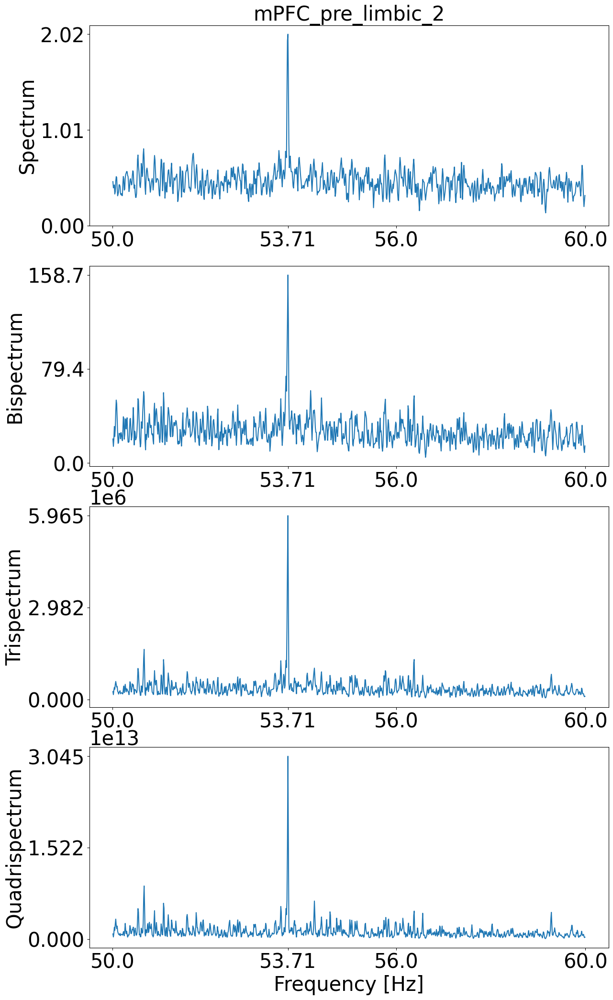

####################################################################################################


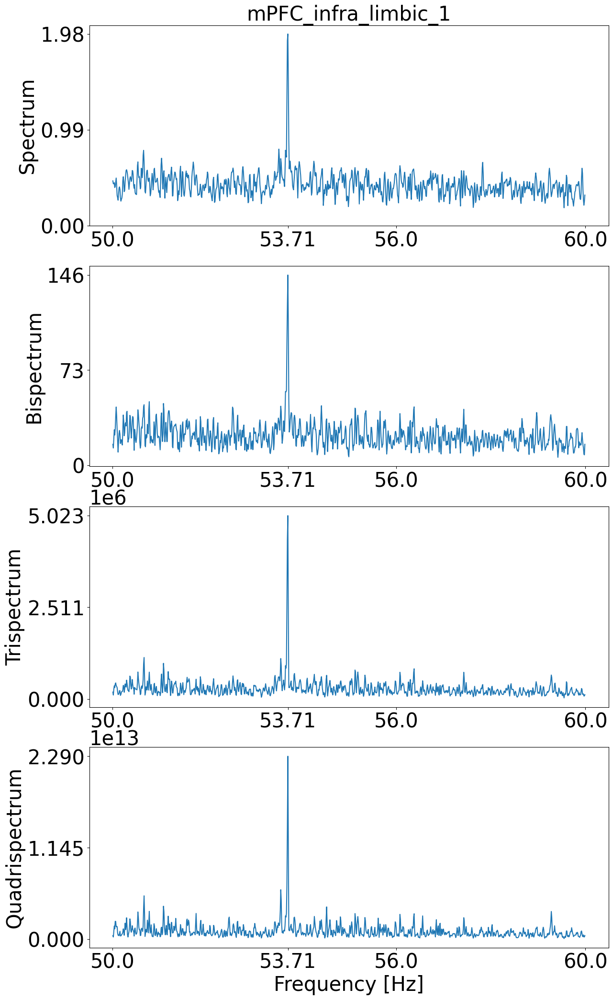

####################################################################################################


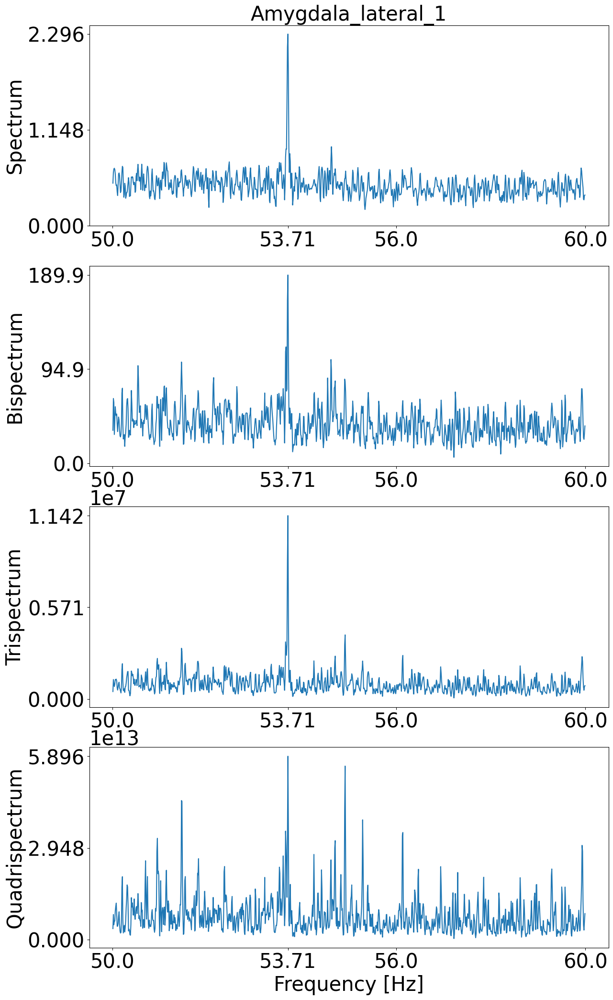

####################################################################################################


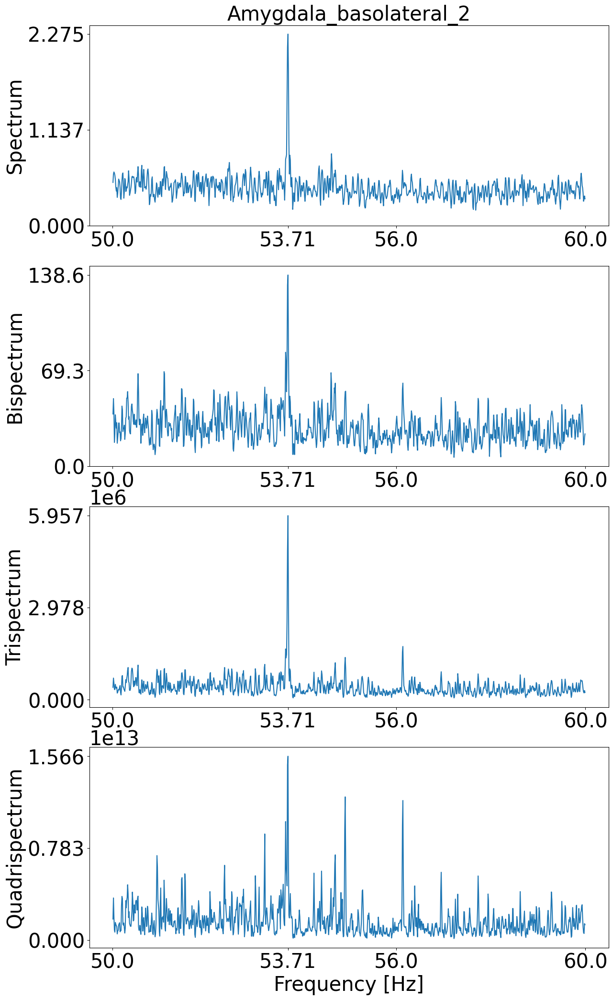

####################################################################################################


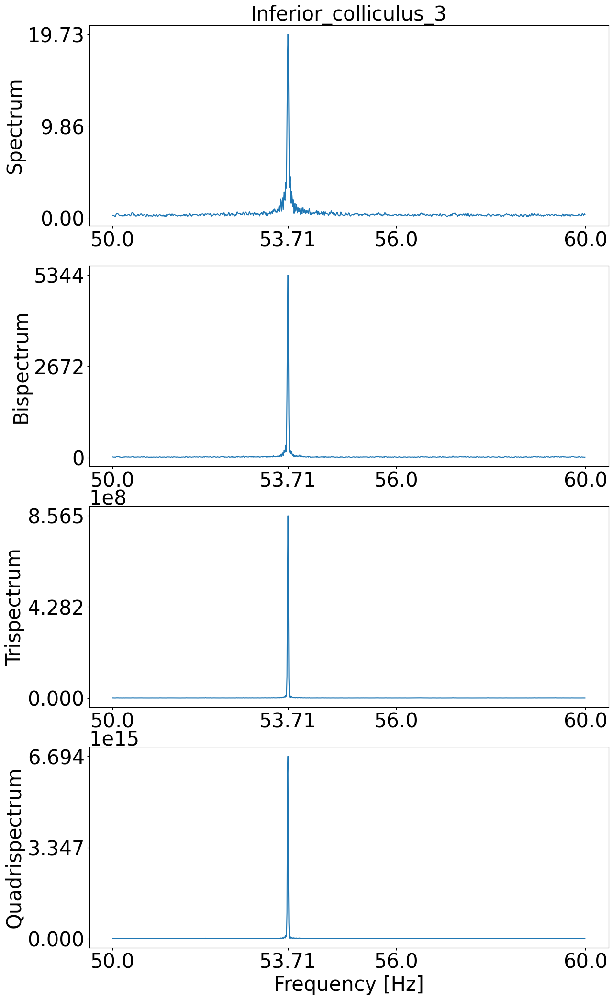

####################################################################################################


In [89]:
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)


freq_array = hosa_df.loc[(hosa_df.frequency>=(lim or [0, 100])[0])&(hosa_df.frequency<=(lim or [0, 100])[1]), "frequency"].to_numpy()

for column in columns[1:]:
    y_spectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tds_amp_{column}"].to_numpy()
    y_bispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdbs_amp_{column}"].to_numpy()
    y_trispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdts_amp_{column}"].to_numpy()
    y_quadrispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdqs_amp_{column}"].to_numpy()

    fig = plt.figure(figsize=(14,25))

    plt.subplot(411)
    plt.title(column)
    plt.plot(freq_array, y_spectrum)
    plt.ylabel("Spectrum")
    y_ticks = np.array([0, y_spectrum.max()/2, y_spectrum.max()])
    plt.yticks(y_ticks)
    plt.xticks(ticks=ticks, labels=labels)

    plt.subplot(412)
    plt.plot(freq_array, y_bispectrum)
    plt.ylabel("Bispectrum")
    y_ticks = np.array([0, y_bispectrum.max()/2, y_bispectrum.max()])
    plt.yticks(y_ticks)
    plt.xticks(ticks=ticks, labels=labels)

    plt.subplot(413)
    plt.plot(freq_array, y_trispectrum)
    plt.ylabel("Trispectrum")
    y_ticks = np.array([0, y_trispectrum.max()/2, y_trispectrum.max()])
    plt.yticks(y_ticks)
    plt.xticks(ticks=ticks, labels=labels)

    plt.subplot(414)
    plt.plot(freq_array, y_quadrispectrum)
    plt.ylabel("Quadrispectrum")
    y_ticks = np.array([0, y_quadrispectrum.max()/2, y_quadrispectrum.max()])
    plt.yticks(y_ticks)
    plt.xticks(ticks=ticks, labels=labels)

    plt.xlabel("Frequency [Hz]")
    
    without_zoom_folder: str = f"{os.getcwd()}/without_zoom"
    if not os.path.exists(without_zoom_folder):
          
        os.makedirs(without_zoom_folder)
    
    if zoom:
        zoom_folder: str = f"with_zoom_{lim[0]}_to_{lim[1]}"
        if not os.path.exists(zoom_folder):

            os.makedirs(zoom_folder)
    else:
        zoom_folder = ""

    event_folder: str = f"{zoom_folder*zoom + 'without_zoom'*(not zoom)}/events"
    
    if not os.path.exists(event_folder):
          
        os.makedirs(event_folder)
    
    plt.savefig(
        f"{zoom_folder*zoom + 'without_zoom'*(not zoom)}/events/hosa_{id_file}_{column}{f'_zoom_{(lim or [None])[0]}_to_{(lim or [None, None])[1]}'*(lim is not None)}_mean.jpg",
        format="jpg",
        bbox_inches='tight', 
        dpi=150
    )

    plt.show()

    print(f"#"*100)

In [90]:
ERRO

NameError: name 'ERRO' is not defined

# Freezing events

# Selecting Data to model - EVENT 5

# 1 segundo

In [ ]:
threshold_seconds: int = 1

In [ ]:
  
for event_number in range(1, len(data_backup.freezing.unique())):
    time_description: str = f"{threshold_seconds}_second{'s'*(threshold_seconds>1)}"
    id_results: str = f"freezing_{event_number}_{time_description}"
    logger.info(f"Processing {id_results}")
    event_data = select_event_window(
        df=data_backup, 
        event_name=f"freezing_{event_number}", 
        samples_before=0, 
        samples_after=0,
        freezing=True
    )
    
    threshold = event_data.Time.to_numpy()[0] + threshold_seconds
    event_data = event_data.loc[event_data.Time <= threshold, :]

    path_files = f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv'
    load_already_calculated: bool = os.path.isfile(path_files)
    if load_already_calculated:
        logger.info("HOSA already calculated. Loading...")
        hosa_df = pd.read_csv(path_files)
        logger.success("HOSA loaded!")

    else:
        logger.info("HOSA not calculated yet. Generating hosa...")
        logger.info(f"\nProcessing freezing event {event_number}")

        spectrum_df_amps = pd.DataFrame()
        spectrum_df_phases = pd.DataFrame()

        bispectrum_df_amps = pd.DataFrame()
        bispectrum_df_phases = pd.DataFrame()

        trispectrum_df_amps = pd.DataFrame()
        trispectrum_df_phases = pd.DataFrame()

        quadrispectrum_df_amps = pd.DataFrame()
        quadrispectrum_df_phases = pd.DataFrame()

        hosa_df = pd.DataFrame()

        logger.info("Processing the tdqs... This may take a while...\n")
        start_time = perf_counter()

        # Process the tdqs for each channel, in parallel

        f = lambda x: tdqs_object.run_td4spectrum(x)
        channels_columns = columns[1:]

        with Pool() as pool:

            for result in pool.map(f, [{column: event_data.loc[: , column].to_numpy()} for column in channels_columns]):
                column, result_data = list(result.items())[0]
                (
                    frequency_array, 
                    spectrum, 
                    phase_spectrum, 
                    bispectrum, 
                    phase_bispectrum, 
                    trispectrum, 
                    phase_trispectrum, 
                    tetraspectrum, 
                    phase_tetraspectrum
                ) = result_data

                if (
                    "frequency" not in spectrum_df_amps.columns or 
                    "frequency" not in bispectrum_df_amps.columns or
                    "frequency" not in hosa_df
                ):
                    spectrum_df_amps = spectrum_df_amps.assign(frequency=frequency_array)
                    bispectrum_df_amps = bispectrum_df_amps.assign(frequency=frequency_array)
                    hosa_df =hosa_df.assign(frequency=frequency_array)


                spectrum_df_amps = spectrum_df_amps.assign(**{f"tds_amp_{column}": spectrum})
                spectrum_df_phases = spectrum_df_phases.assign(**{f"tds_phase_{column}": phase_spectrum})

                bispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdbs_amp_{column}": bispectrum})
                bispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdbs_phase_{column}": phase_bispectrum})

                trispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdts_amp_{column}": trispectrum})
                trispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdts_phase_{column}": phase_trispectrum})

                quadrispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdqs_amp_{column}": tetraspectrum})
                quadrispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdqs_phase_{column}": phase_tetraspectrum})

                hosa_df = hosa_df.assign(**{f"tds_amp_{column}": spectrum})
                hosa_df = hosa_df.assign(**{f"tdbs_amp_{column}": bispectrum})
                hosa_df = hosa_df.assign(**{f"tdts_amp_{column}": trispectrum})
                hosa_df = hosa_df.assign(**{f"tdqs_amp_{column}": tetraspectrum})


        spectrum_df = pd.concat([spectrum_df_amps, spectrum_df_phases], axis=1)
        bispectrum_df = pd.concat([bispectrum_df_amps, bispectrum_df_phases], axis=1)
        trispectrum_df = pd.concat([trispectrum_df_amps, trispectrum_df_phases], axis=1)
        quadrispectrum_df = pd.concat([quadrispectrum_df_amps, quadrispectrum_df_phases], axis=1)

        hosa_df.to_csv(f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv', index=False)

        end_time = perf_counter()

        logger.success(f"Done. Elapsed time: {seconds_to_formatted_time(end_time - start_time)}")
    
    freq_array = hosa_df.loc[(hosa_df.frequency>=(lim or [0, 100])[0])&(hosa_df.frequency<=(lim or [0, 100])[1]), "frequency"].to_numpy()

    for column in columns[1:]:
        y_spectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tds_amp_{column}"].to_numpy()
        y_bispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdbs_amp_{column}"].to_numpy()
        y_trispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdts_amp_{column}"].to_numpy()
        y_quadrispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdqs_amp_{column}"].to_numpy()

        fig = plt.figure(figsize=(14,25))

        plt.subplot(411)
        plt.title(column)
        plt.plot(freq_array, y_spectrum)
        plt.ylabel("Spectrum")
        y_ticks = np.array([0, y_spectrum.max()/2, y_spectrum.max()])
        plt.yticks(y_ticks)
        plt.xticks(ticks=ticks, labels=labels, fontsize=15)

        plt.subplot(412)
        plt.plot(freq_array, y_bispectrum)
        plt.ylabel("Bispectrum")
        y_ticks = np.array([0, y_bispectrum.max()/2, y_bispectrum.max()])
        plt.yticks(y_ticks)
        plt.xticks(ticks=ticks, labels=labels, fontsize=15)

        plt.subplot(413)
        plt.plot(freq_array, y_trispectrum)
        plt.ylabel("Trispectrum")
        y_ticks = np.array([0, y_trispectrum.max()/2, y_trispectrum.max()])
        plt.yticks(y_ticks)
        plt.xticks(ticks=ticks, labels=labels, fontsize=15)

        plt.subplot(414)
        plt.plot(freq_array, y_quadrispectrum)
        plt.ylabel("Quadrispectrum")
        y_ticks = np.array([0, y_quadrispectrum.max()/2, y_quadrispectrum.max()])
        plt.yticks(y_ticks)
        plt.xticks(ticks=ticks, labels=labels, fontsize=15)

        event_folder: str = f"{zoom_folder*zoom + 'without_zoom'*(not zoom)}/{time_description}"
    
        if not os.path.exists(event_folder):
          
            os.makedirs(event_folder)
        
        plt.xlabel("Frequency [Hz]")
        plt.savefig(
            f"{event_folder}/hosa_{id_file}_{id_results}_{column}_{'zoom'*(lim is not None)}.jpg",
            format="jpg",
            bbox_inches='tight', 
            dpi=150
        )

        plt.show()

        print(f"#"*100)

In [ ]:
threshold_seconds: int = 2

In [ ]:
  
for event_number in range(1, len(data_backup.freezing.unique())):
    time_description: str = f"{threshold_seconds}_second{'s'*(threshold_seconds>1)}"
    id_results: str = f"freezing_{event_number}_{time_description}"
    logger.info(f"Processing {id_results}")
    event_data = select_event_window(
        df=data_backup, 
        event_name=f"freezing_{event_number}", 
        samples_before=0, 
        samples_after=0,
        freezing=True
    )
    
    threshold = event_data.Time.to_numpy()[0] + threshold_seconds
    event_data = event_data.loc[event_data.Time <= threshold, :]

    path_files = f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv'
    load_already_calculated: bool = os.path.isfile(path_files)
    if load_already_calculated:
        logger.info("HOSA already calculated. Loading...")
        hosa_df = pd.read_csv(path_files)
        logger.success("HOSA loaded!")

    else:
        logger.info("HOSA not calculated yet. Generating hosa...")
        logger.info(f"\nProcessing freezing event {event_number}")

        spectrum_df_amps = pd.DataFrame()
        spectrum_df_phases = pd.DataFrame()

        bispectrum_df_amps = pd.DataFrame()
        bispectrum_df_phases = pd.DataFrame()

        trispectrum_df_amps = pd.DataFrame()
        trispectrum_df_phases = pd.DataFrame()

        quadrispectrum_df_amps = pd.DataFrame()
        quadrispectrum_df_phases = pd.DataFrame()

        hosa_df = pd.DataFrame()

        logger.info("Processing the tdqs... This may take a while...\n")
        start_time = perf_counter()

        # Process the tdqs for each channel, in parallel

        f = lambda x: tdqs_object.run_td4spectrum(x)
        channels_columns = columns[1:]

        with Pool() as pool:

            for result in pool.map(f, [{column: event_data.loc[: , column].to_numpy()} for column in channels_columns]):
                column, result_data = list(result.items())[0]
                (
                    frequency_array, 
                    spectrum, 
                    phase_spectrum, 
                    bispectrum, 
                    phase_bispectrum, 
                    trispectrum, 
                    phase_trispectrum, 
                    tetraspectrum, 
                    phase_tetraspectrum
                ) = result_data

                if (
                    "frequency" not in spectrum_df_amps.columns or 
                    "frequency" not in bispectrum_df_amps.columns or
                    "frequency" not in hosa_df
                ):
                    spectrum_df_amps = spectrum_df_amps.assign(frequency=frequency_array)
                    bispectrum_df_amps = bispectrum_df_amps.assign(frequency=frequency_array)
                    hosa_df =hosa_df.assign(frequency=frequency_array)


                spectrum_df_amps = spectrum_df_amps.assign(**{f"tds_amp_{column}": spectrum})
                spectrum_df_phases = spectrum_df_phases.assign(**{f"tds_phase_{column}": phase_spectrum})

                bispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdbs_amp_{column}": bispectrum})
                bispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdbs_phase_{column}": phase_bispectrum})

                trispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdts_amp_{column}": trispectrum})
                trispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdts_phase_{column}": phase_trispectrum})

                quadrispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdqs_amp_{column}": tetraspectrum})
                quadrispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdqs_phase_{column}": phase_tetraspectrum})

                hosa_df = hosa_df.assign(**{f"tds_amp_{column}": spectrum})
                hosa_df = hosa_df.assign(**{f"tdbs_amp_{column}": bispectrum})
                hosa_df = hosa_df.assign(**{f"tdts_amp_{column}": trispectrum})
                hosa_df = hosa_df.assign(**{f"tdqs_amp_{column}": tetraspectrum})


        spectrum_df = pd.concat([spectrum_df_amps, spectrum_df_phases], axis=1)
        bispectrum_df = pd.concat([bispectrum_df_amps, bispectrum_df_phases], axis=1)
        trispectrum_df = pd.concat([trispectrum_df_amps, trispectrum_df_phases], axis=1)
        quadrispectrum_df = pd.concat([quadrispectrum_df_amps, quadrispectrum_df_phases], axis=1)

        hosa_df.to_csv(f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv', index=False)

        end_time = perf_counter()

        logger.success(f"Done. Elapsed time: {seconds_to_formatted_time(end_time - start_time)}")
    
    freq_array = hosa_df.loc[(hosa_df.frequency>=(lim or [0, 100])[0])&(hosa_df.frequency<=(lim or [0, 100])[1]), "frequency"].to_numpy()

    for column in columns[1:]:
        y_spectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tds_amp_{column}"].to_numpy()
        y_bispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdbs_amp_{column}"].to_numpy()
        y_trispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdts_amp_{column}"].to_numpy()
        y_quadrispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdqs_amp_{column}"].to_numpy()

        fig = plt.figure(figsize=(14,25))

        plt.subplot(411)
        plt.title(column)
        plt.plot(freq_array, y_spectrum)
        plt.ylabel("Spectrum")
        y_ticks = np.array([0, y_spectrum.max()/2, y_spectrum.max()])
        plt.yticks(y_ticks)
        plt.xticks(ticks=ticks, labels=labels, fontsize=15)

        plt.subplot(412)
        plt.plot(freq_array, y_bispectrum)
        plt.ylabel("Bispectrum")
        y_ticks = np.array([0, y_bispectrum.max()/2, y_bispectrum.max()])
        plt.yticks(y_ticks)
        plt.xticks(ticks=ticks, labels=labels, fontsize=15)

        plt.subplot(413)
        plt.plot(freq_array, y_trispectrum)
        plt.ylabel("Trispectrum")
        y_ticks = np.array([0, y_trispectrum.max()/2, y_trispectrum.max()])
        plt.yticks(y_ticks)
        plt.xticks(ticks=ticks, labels=labels, fontsize=15)

        plt.subplot(414)
        plt.plot(freq_array, y_quadrispectrum)
        plt.ylabel("Quadrispectrum")
        y_ticks = np.array([0, y_quadrispectrum.max()/2, y_quadrispectrum.max()])
        plt.yticks(y_ticks)
        plt.xticks(ticks=ticks, labels=labels, fontsize=15)

        event_folder: str = f"{zoom_folder*zoom + 'without_zoom'*(not zoom)}/{time_description}"
    
        if not os.path.exists(event_folder):
          
            os.makedirs(event_folder)
        
        plt.xlabel("Frequency [Hz]")
        plt.savefig(
            f"{event_folder}/hosa_{id_file}_{id_results}_{column}_{'zoom'*(lim is not None)}.jpg",
            format="jpg",
            bbox_inches='tight', 
            dpi=150
        )

        plt.show()

        print(f"#"*100)

In [ ]:
threshold_seconds: int = 3

In [ ]:
  
for event_number in range(1, len(data_backup.freezing.unique())):
    time_description: str = f"{threshold_seconds}_second{'s'*(threshold_seconds>1)}"
    id_results: str = f"freezing_{event_number}_{time_description}"
    logger.info(f"Processing {id_results}")
    event_data = select_event_window(
        df=data_backup, 
        event_name=f"freezing_{event_number}", 
        samples_before=0, 
        samples_after=0,
        freezing=True
    )
    
    threshold = event_data.Time.to_numpy()[0] + threshold_seconds
    event_data = event_data.loc[event_data.Time <= threshold, :]

    path_files = f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv'
    load_already_calculated: bool = os.path.isfile(path_files)
    if load_already_calculated:
        logger.info("HOSA already calculated. Loading...")
        hosa_df = pd.read_csv(path_files)
        logger.success("HOSA loaded!")

    else:
        logger.info("HOSA not calculated yet. Generating hosa...")
        logger.info(f"\nProcessing freezing event {event_number}")

        spectrum_df_amps = pd.DataFrame()
        spectrum_df_phases = pd.DataFrame()

        bispectrum_df_amps = pd.DataFrame()
        bispectrum_df_phases = pd.DataFrame()

        trispectrum_df_amps = pd.DataFrame()
        trispectrum_df_phases = pd.DataFrame()

        quadrispectrum_df_amps = pd.DataFrame()
        quadrispectrum_df_phases = pd.DataFrame()

        hosa_df = pd.DataFrame()

        logger.info("Processing the tdqs... This may take a while...\n")
        start_time = perf_counter()

        # Process the tdqs for each channel, in parallel

        f = lambda x: tdqs_object.run_td4spectrum(x)
        channels_columns = columns[1:]

        with Pool() as pool:

            for result in pool.map(f, [{column: event_data.loc[: , column].to_numpy()} for column in channels_columns]):
                column, result_data = list(result.items())[0]
                (
                    frequency_array, 
                    spectrum, 
                    phase_spectrum, 
                    bispectrum, 
                    phase_bispectrum, 
                    trispectrum, 
                    phase_trispectrum, 
                    tetraspectrum, 
                    phase_tetraspectrum
                ) = result_data

                if (
                    "frequency" not in spectrum_df_amps.columns or 
                    "frequency" not in bispectrum_df_amps.columns or
                    "frequency" not in hosa_df
                ):
                    spectrum_df_amps = spectrum_df_amps.assign(frequency=frequency_array)
                    bispectrum_df_amps = bispectrum_df_amps.assign(frequency=frequency_array)
                    hosa_df =hosa_df.assign(frequency=frequency_array)


                spectrum_df_amps = spectrum_df_amps.assign(**{f"tds_amp_{column}": spectrum})
                spectrum_df_phases = spectrum_df_phases.assign(**{f"tds_phase_{column}": phase_spectrum})

                bispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdbs_amp_{column}": bispectrum})
                bispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdbs_phase_{column}": phase_bispectrum})

                trispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdts_amp_{column}": trispectrum})
                trispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdts_phase_{column}": phase_trispectrum})

                quadrispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdqs_amp_{column}": tetraspectrum})
                quadrispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdqs_phase_{column}": phase_tetraspectrum})

                hosa_df = hosa_df.assign(**{f"tds_amp_{column}": spectrum})
                hosa_df = hosa_df.assign(**{f"tdbs_amp_{column}": bispectrum})
                hosa_df = hosa_df.assign(**{f"tdts_amp_{column}": trispectrum})
                hosa_df = hosa_df.assign(**{f"tdqs_amp_{column}": tetraspectrum})


        spectrum_df = pd.concat([spectrum_df_amps, spectrum_df_phases], axis=1)
        bispectrum_df = pd.concat([bispectrum_df_amps, bispectrum_df_phases], axis=1)
        trispectrum_df = pd.concat([trispectrum_df_amps, trispectrum_df_phases], axis=1)
        quadrispectrum_df = pd.concat([quadrispectrum_df_amps, quadrispectrum_df_phases], axis=1)

        hosa_df.to_csv(f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv', index=False)

        end_time = perf_counter()

        logger.success(f"Done. Elapsed time: {seconds_to_formatted_time(end_time - start_time)}")
    
    freq_array = hosa_df.loc[(hosa_df.frequency>=(lim or [0, 100])[0])&(hosa_df.frequency<=(lim or [0, 100])[1]), "frequency"].to_numpy()

    for column in columns[1:]:
        y_spectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tds_amp_{column}"].to_numpy()
        y_bispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdbs_amp_{column}"].to_numpy()
        y_trispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdts_amp_{column}"].to_numpy()
        y_quadrispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdqs_amp_{column}"].to_numpy()

        fig = plt.figure(figsize=(14,25))

        plt.subplot(411)
        plt.title(column)
        plt.plot(freq_array, y_spectrum)
        plt.ylabel("Spectrum")
        y_ticks = np.array([0, y_spectrum.max()/2, y_spectrum.max()])
        plt.yticks(y_ticks)
        plt.xticks(ticks=ticks, labels=labels, fontsize=15)

        plt.subplot(412)
        plt.plot(freq_array, y_bispectrum)
        plt.ylabel("Bispectrum")
        y_ticks = np.array([0, y_bispectrum.max()/2, y_bispectrum.max()])
        plt.yticks(y_ticks)
        plt.xticks(ticks=ticks, labels=labels, fontsize=15)

        plt.subplot(413)
        plt.plot(freq_array, y_trispectrum)
        plt.ylabel("Trispectrum")
        y_ticks = np.array([0, y_trispectrum.max()/2, y_trispectrum.max()])
        plt.yticks(y_ticks)
        plt.xticks(ticks=ticks, labels=labels, fontsize=15)

        plt.subplot(414)
        plt.plot(freq_array, y_quadrispectrum)
        plt.ylabel("Quadrispectrum")
        y_ticks = np.array([0, y_quadrispectrum.max()/2, y_quadrispectrum.max()])
        plt.yticks(y_ticks)
        plt.xticks(ticks=ticks, labels=labels, fontsize=15)

        event_folder: str = f"{zoom_folder*zoom + 'without_zoom'*(not zoom)}/{time_description}"
    
        if not os.path.exists(event_folder):
          
            os.makedirs(event_folder)
        
        plt.xlabel("Frequency [Hz]")
        plt.savefig(
            f"{event_folder}/hosa_{id_file}_{id_results}_{column}_{'zoom'*(lim is not None)}.jpg",
            format="jpg",
            bbox_inches='tight', 
            dpi=150
        )

        plt.show()

        print(f"#"*100)

# Before Freezing behavior

In [ ]:
# Method to extract events from dataframe

def select_window_before_freezing_event(
    df: pd.DataFrame, 
    event_name: str, 
    seconds_before: float = 0, 
    duration: int = 0,
) -> pd.DataFrame:
    """
    Method to extract the slice of the dataframe which contais the the "duration" 
    seconds before "seconds_before" seconds before the event.
    """
    
    window_index = np.argwhere(df.freezing.to_numpy() == event_name).flatten()
    event_begin_time = df.Time.to_numpy()[window_index[0]]
    
    begin_time = event_begin_time - seconds_before
    end_time = begin_time + duration
    
    return df.loc[(df.Time>=begin_time)&(df.Time<=end_time), :]

In [ ]:
threshold_seconds: int = 1

In [ ]:
for event_number in range(1, 3):
    time_description: str = f"{threshold_seconds}_second{'s'*(threshold_seconds>1)}_before"
    id_results: str = f"freezing_{event_number}_{time_description}"
    logger.info(f"Processing {id_results}")
    event_data = select_window_before_freezing_event(
        df=data_backup, 
        event_name=f"freezing_{event_number}", 
        seconds_before=threshold_seconds, 
        duration=threshold_seconds,
    )
    
    threshold = event_data.Time.to_numpy()[0] + threshold_seconds
    event_data = event_data.loc[event_data.Time <= threshold, :]

    path_files = f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv'
    load_already_calculated: bool = os.path.isfile(path_files)
    if load_already_calculated:
        logger.info("HOSA already calculated. Loading...")
        hosa_df = pd.read_csv(path_files)
        logger.success("HOSA loaded!")

    else:
        logger.info("HOSA not calculated yet. Generating hosa...")
        logger.info(f"\nProcessing freezing event {event_number}")

        spectrum_df_amps = pd.DataFrame()
        spectrum_df_phases = pd.DataFrame()

        bispectrum_df_amps = pd.DataFrame()
        bispectrum_df_phases = pd.DataFrame()

        trispectrum_df_amps = pd.DataFrame()
        trispectrum_df_phases = pd.DataFrame()

        quadrispectrum_df_amps = pd.DataFrame()
        quadrispectrum_df_phases = pd.DataFrame()

        hosa_df = pd.DataFrame()

        logger.info("Processing the tdqs... This may take a while...\n")
        start_time = perf_counter()

        # Process the tdqs for each channel, in parallel

        f = lambda x: tdqs_object.run_td4spectrum(x)
        channels_columns = columns[1:]

        with Pool() as pool:

            for result in pool.map(f, [{column: event_data.loc[: , column].to_numpy()} for column in channels_columns]):
                column, result_data = list(result.items())[0]
                (
                    frequency_array, 
                    spectrum, 
                    phase_spectrum, 
                    bispectrum, 
                    phase_bispectrum, 
                    trispectrum, 
                    phase_trispectrum, 
                    tetraspectrum, 
                    phase_tetraspectrum
                ) = result_data

                if (
                    "frequency" not in spectrum_df_amps.columns or 
                    "frequency" not in bispectrum_df_amps.columns or
                    "frequency" not in hosa_df
                ):
                    spectrum_df_amps = spectrum_df_amps.assign(frequency=frequency_array)
                    bispectrum_df_amps = bispectrum_df_amps.assign(frequency=frequency_array)
                    hosa_df =hosa_df.assign(frequency=frequency_array)


                spectrum_df_amps = spectrum_df_amps.assign(**{f"tds_amp_{column}": spectrum})
                spectrum_df_phases = spectrum_df_phases.assign(**{f"tds_phase_{column}": phase_spectrum})

                bispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdbs_amp_{column}": bispectrum})
                bispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdbs_phase_{column}": phase_bispectrum})

                trispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdts_amp_{column}": trispectrum})
                trispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdts_phase_{column}": phase_trispectrum})

                quadrispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdqs_amp_{column}": tetraspectrum})
                quadrispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdqs_phase_{column}": phase_tetraspectrum})

                hosa_df = hosa_df.assign(**{f"tds_amp_{column}": spectrum})
                hosa_df = hosa_df.assign(**{f"tdbs_amp_{column}": bispectrum})
                hosa_df = hosa_df.assign(**{f"tdts_amp_{column}": trispectrum})
                hosa_df = hosa_df.assign(**{f"tdqs_amp_{column}": tetraspectrum})


        spectrum_df = pd.concat([spectrum_df_amps, spectrum_df_phases], axis=1)
        bispectrum_df = pd.concat([bispectrum_df_amps, bispectrum_df_phases], axis=1)
        trispectrum_df = pd.concat([trispectrum_df_amps, trispectrum_df_phases], axis=1)
        quadrispectrum_df = pd.concat([quadrispectrum_df_amps, quadrispectrum_df_phases], axis=1)

        hosa_df.to_csv(f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv', index=False)

        end_time = perf_counter()

        logger.success(f"Done. Elapsed time: {seconds_to_formatted_time(end_time - start_time)}")
    
    freq_array = hosa_df.loc[(hosa_df.frequency>=(lim or [0, 100])[0])&(hosa_df.frequency<=(lim or [0, 100])[1]), "frequency"].to_numpy()

    for column in columns[1:]:
        y_spectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tds_amp_{column}"].to_numpy()
        y_bispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdbs_amp_{column}"].to_numpy()
        y_trispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdts_amp_{column}"].to_numpy()
        y_quadrispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdqs_amp_{column}"].to_numpy()

        fig = plt.figure(figsize=(14,25))

        plt.subplot(411)
        plt.title(column)
        plt.plot(freq_array, y_spectrum)
        plt.ylabel("Spectrum")
        y_ticks = np.array([0, y_spectrum.max()/2, y_spectrum.max()])
        plt.yticks(y_ticks)
        plt.xticks(ticks=ticks, labels=labels, fontsize=15)

        plt.subplot(412)
        plt.plot(freq_array, y_bispectrum)
        plt.ylabel("Bispectrum")
        y_ticks = np.array([0, y_bispectrum.max()/2, y_bispectrum.max()])
        plt.yticks(y_ticks)
        plt.xticks(ticks=ticks, labels=labels, fontsize=15)

        plt.subplot(413)
        plt.plot(freq_array, y_trispectrum)
        plt.ylabel("Trispectrum")
        y_ticks = np.array([0, y_trispectrum.max()/2, y_trispectrum.max()])
        plt.yticks(y_ticks)
        plt.xticks(ticks=ticks, labels=labels, fontsize=15)

        plt.subplot(414)
        plt.plot(freq_array, y_quadrispectrum)
        plt.ylabel("Quadrispectrum")
        y_ticks = np.array([0, y_quadrispectrum.max()/2, y_quadrispectrum.max()])
        plt.yticks(y_ticks)
        plt.xticks(ticks=ticks, labels=labels, fontsize=15)

        event_folder: str = f"{zoom_folder*zoom + 'without_zoom'*(not zoom)}/{time_description}"
    
        if not os.path.exists(event_folder):
          
            os.makedirs(event_folder)
        
        plt.xlabel("Frequency [Hz]")
        plt.savefig(
            f"{event_folder}/hosa_{id_file}_{id_results}_{column}_{'zoom'*(lim is not None)}.jpg",
            format="jpg",
            bbox_inches='tight', 
            dpi=150
        )

        plt.show()

        print(f"#"*100)

In [ ]:
threshold_seconds: int = 2

In [ ]:
for event_number in range(1, 3):
    time_description: str = f"{threshold_seconds}_second{'s'*(threshold_seconds>1)}_before"
    id_results: str = f"freezing_{event_number}_{time_description}"
    logger.info(f"Processing {id_results}")
    event_data = select_window_before_freezing_event(
        df=data_backup, 
        event_name=f"freezing_{event_number}", 
        seconds_before=threshold_seconds, 
        duration=threshold_seconds,
    )
    
    threshold = event_data.Time.to_numpy()[0] + threshold_seconds
    event_data = event_data.loc[event_data.Time <= threshold, :]

    path_files = f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv'
    load_already_calculated: bool = os.path.isfile(path_files)
    if load_already_calculated:
        logger.info("HOSA already calculated. Loading...")
        hosa_df = pd.read_csv(path_files)
        logger.success("HOSA loaded!")

    else:
        logger.info("HOSA not calculated yet. Generating hosa...")
        logger.info(f"\nProcessing freezing event {event_number}")

        spectrum_df_amps = pd.DataFrame()
        spectrum_df_phases = pd.DataFrame()

        bispectrum_df_amps = pd.DataFrame()
        bispectrum_df_phases = pd.DataFrame()

        trispectrum_df_amps = pd.DataFrame()
        trispectrum_df_phases = pd.DataFrame()

        quadrispectrum_df_amps = pd.DataFrame()
        quadrispectrum_df_phases = pd.DataFrame()

        hosa_df = pd.DataFrame()

        logger.info("Processing the tdqs... This may take a while...\n")
        start_time = perf_counter()

        # Process the tdqs for each channel, in parallel

        f = lambda x: tdqs_object.run_td4spectrum(x)
        channels_columns = columns[1:]

        with Pool() as pool:

            for result in pool.map(f, [{column: event_data.loc[: , column].to_numpy()} for column in channels_columns]):
                column, result_data = list(result.items())[0]
                (
                    frequency_array, 
                    spectrum, 
                    phase_spectrum, 
                    bispectrum, 
                    phase_bispectrum, 
                    trispectrum, 
                    phase_trispectrum, 
                    tetraspectrum, 
                    phase_tetraspectrum
                ) = result_data

                if (
                    "frequency" not in spectrum_df_amps.columns or 
                    "frequency" not in bispectrum_df_amps.columns or
                    "frequency" not in hosa_df
                ):
                    spectrum_df_amps = spectrum_df_amps.assign(frequency=frequency_array)
                    bispectrum_df_amps = bispectrum_df_amps.assign(frequency=frequency_array)
                    hosa_df =hosa_df.assign(frequency=frequency_array)


                spectrum_df_amps = spectrum_df_amps.assign(**{f"tds_amp_{column}": spectrum})
                spectrum_df_phases = spectrum_df_phases.assign(**{f"tds_phase_{column}": phase_spectrum})

                bispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdbs_amp_{column}": bispectrum})
                bispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdbs_phase_{column}": phase_bispectrum})

                trispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdts_amp_{column}": trispectrum})
                trispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdts_phase_{column}": phase_trispectrum})

                quadrispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdqs_amp_{column}": tetraspectrum})
                quadrispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdqs_phase_{column}": phase_tetraspectrum})

                hosa_df = hosa_df.assign(**{f"tds_amp_{column}": spectrum})
                hosa_df = hosa_df.assign(**{f"tdbs_amp_{column}": bispectrum})
                hosa_df = hosa_df.assign(**{f"tdts_amp_{column}": trispectrum})
                hosa_df = hosa_df.assign(**{f"tdqs_amp_{column}": tetraspectrum})


        spectrum_df = pd.concat([spectrum_df_amps, spectrum_df_phases], axis=1)
        bispectrum_df = pd.concat([bispectrum_df_amps, bispectrum_df_phases], axis=1)
        trispectrum_df = pd.concat([trispectrum_df_amps, trispectrum_df_phases], axis=1)
        quadrispectrum_df = pd.concat([quadrispectrum_df_amps, quadrispectrum_df_phases], axis=1)

        hosa_df.to_csv(f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv', index=False)

        end_time = perf_counter()

        logger.success(f"Done. Elapsed time: {seconds_to_formatted_time(end_time - start_time)}")
    
    freq_array = hosa_df.loc[(hosa_df.frequency>=(lim or [0, 100])[0])&(hosa_df.frequency<=(lim or [0, 100])[1]), "frequency"].to_numpy()

    for column in columns[1:]:
        y_spectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tds_amp_{column}"].to_numpy()
        y_bispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdbs_amp_{column}"].to_numpy()
        y_trispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdts_amp_{column}"].to_numpy()
        y_quadrispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdqs_amp_{column}"].to_numpy()

        fig = plt.figure(figsize=(14,25))

        plt.subplot(411)
        plt.title(column)
        plt.plot(freq_array, y_spectrum)
        plt.ylabel("Spectrum")
        y_ticks = np.array([0, y_spectrum.max()/2, y_spectrum.max()])
        plt.yticks(y_ticks)
        plt.xticks(ticks=ticks, labels=labels, fontsize=15)

        plt.subplot(412)
        plt.plot(freq_array, y_bispectrum)
        plt.ylabel("Bispectrum")
        y_ticks = np.array([0, y_bispectrum.max()/2, y_bispectrum.max()])
        plt.yticks(y_ticks)
        plt.xticks(ticks=ticks, labels=labels, fontsize=15)

        plt.subplot(413)
        plt.plot(freq_array, y_trispectrum)
        plt.ylabel("Trispectrum")
        y_ticks = np.array([0, y_trispectrum.max()/2, y_trispectrum.max()])
        plt.yticks(y_ticks)
        plt.xticks(ticks=ticks, labels=labels, fontsize=15)

        plt.subplot(414)
        plt.plot(freq_array, y_quadrispectrum)
        plt.ylabel("Quadrispectrum")
        y_ticks = np.array([0, y_quadrispectrum.max()/2, y_quadrispectrum.max()])
        plt.yticks(y_ticks)
        plt.xticks(ticks=ticks, labels=labels, fontsize=15)

        event_folder: str = f"{zoom_folder*zoom + 'without_zoom'*(not zoom)}/{time_description}"
    
        if not os.path.exists(event_folder):
          
            os.makedirs(event_folder)
        
        plt.xlabel("Frequency [Hz]")
        plt.savefig(
            f"{event_folder}/hosa_{id_file}_{id_results}_{column}_{'zoom'*(lim is not None)}.jpg",
            format="jpg",
            bbox_inches='tight', 
            dpi=150
        )

        plt.show()

        print(f"#"*100)

In [ ]:
threshold_seconds: int = 3

In [ ]:
for event_number in range(1, 3):
    time_description: str = f"{threshold_seconds}_second{'s'*(threshold_seconds>1)}_before"
    id_results: str = f"freezing_{event_number}_{time_description}"
    logger.info(f"Processing {id_results}")
    event_data = select_window_before_freezing_event(
        df=data_backup, 
        event_name=f"freezing_{event_number}", 
        seconds_before=threshold_seconds, 
        duration=threshold_seconds,
    )
    
    threshold = event_data.Time.to_numpy()[0] + threshold_seconds
    event_data = event_data.loc[event_data.Time <= threshold, :]

    path_files = f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv'
    load_already_calculated: bool = os.path.isfile(path_files)
    if load_already_calculated:
        logger.info("HOSA already calculated. Loading...")
        hosa_df = pd.read_csv(path_files)
        logger.success("HOSA loaded!")

    else:
        logger.info("HOSA not calculated yet. Generating hosa...")
        logger.info(f"\nProcessing freezing event {event_number}")

        spectrum_df_amps = pd.DataFrame()
        spectrum_df_phases = pd.DataFrame()

        bispectrum_df_amps = pd.DataFrame()
        bispectrum_df_phases = pd.DataFrame()

        trispectrum_df_amps = pd.DataFrame()
        trispectrum_df_phases = pd.DataFrame()

        quadrispectrum_df_amps = pd.DataFrame()
        quadrispectrum_df_phases = pd.DataFrame()

        hosa_df = pd.DataFrame()

        logger.info("Processing the tdqs... This may take a while...\n")
        start_time = perf_counter()

        # Process the tdqs for each channel, in parallel

        f = lambda x: tdqs_object.run_td4spectrum(x)
        channels_columns = columns[1:]

        with Pool() as pool:

            for result in pool.map(f, [{column: event_data.loc[: , column].to_numpy()} for column in channels_columns]):
                column, result_data = list(result.items())[0]
                (
                    frequency_array, 
                    spectrum, 
                    phase_spectrum, 
                    bispectrum, 
                    phase_bispectrum, 
                    trispectrum, 
                    phase_trispectrum, 
                    tetraspectrum, 
                    phase_tetraspectrum
                ) = result_data

                if (
                    "frequency" not in spectrum_df_amps.columns or 
                    "frequency" not in bispectrum_df_amps.columns or
                    "frequency" not in hosa_df
                ):
                    spectrum_df_amps = spectrum_df_amps.assign(frequency=frequency_array)
                    bispectrum_df_amps = bispectrum_df_amps.assign(frequency=frequency_array)
                    hosa_df =hosa_df.assign(frequency=frequency_array)


                spectrum_df_amps = spectrum_df_amps.assign(**{f"tds_amp_{column}": spectrum})
                spectrum_df_phases = spectrum_df_phases.assign(**{f"tds_phase_{column}": phase_spectrum})

                bispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdbs_amp_{column}": bispectrum})
                bispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdbs_phase_{column}": phase_bispectrum})

                trispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdts_amp_{column}": trispectrum})
                trispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdts_phase_{column}": phase_trispectrum})

                quadrispectrum_df_amps = bispectrum_df_amps.assign(**{f"tdqs_amp_{column}": tetraspectrum})
                quadrispectrum_df_phases = bispectrum_df_phases.assign(**{f"tdqs_phase_{column}": phase_tetraspectrum})

                hosa_df = hosa_df.assign(**{f"tds_amp_{column}": spectrum})
                hosa_df = hosa_df.assign(**{f"tdbs_amp_{column}": bispectrum})
                hosa_df = hosa_df.assign(**{f"tdts_amp_{column}": trispectrum})
                hosa_df = hosa_df.assign(**{f"tdqs_amp_{column}": tetraspectrum})


        spectrum_df = pd.concat([spectrum_df_amps, spectrum_df_phases], axis=1)
        bispectrum_df = pd.concat([bispectrum_df_amps, bispectrum_df_phases], axis=1)
        trispectrum_df = pd.concat([trispectrum_df_amps, trispectrum_df_phases], axis=1)
        quadrispectrum_df = pd.concat([quadrispectrum_df_amps, quadrispectrum_df_phases], axis=1)

        hosa_df.to_csv(f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv', index=False)

        end_time = perf_counter()

        logger.success(f"Done. Elapsed time: {seconds_to_formatted_time(end_time - start_time)}")
    
    freq_array = hosa_df.loc[(hosa_df.frequency>=(lim or [0, 100])[0])&(hosa_df.frequency<=(lim or [0, 100])[1]), "frequency"].to_numpy()

    for column in columns[1:]:
        y_spectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tds_amp_{column}"].to_numpy()
        y_bispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdbs_amp_{column}"].to_numpy()
        y_trispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdts_amp_{column}"].to_numpy()
        y_quadrispectrum = hosa_df.loc[(hosa_df.frequency>=(lim or [4, 60])[0])&(hosa_df.frequency<=(lim or [4, 60])[1]), f"tdqs_amp_{column}"].to_numpy()

        fig = plt.figure(figsize=(14,25))

        plt.subplot(411)
        plt.title(column)
        plt.plot(freq_array, y_spectrum)
        plt.ylabel("Spectrum")
        y_ticks = np.array([0, y_spectrum.max()/2, y_spectrum.max()])
        plt.yticks(y_ticks)
        plt.xticks(ticks=ticks, labels=labels, fontsize=15)

        plt.subplot(412)
        plt.plot(freq_array, y_bispectrum)
        plt.ylabel("Bispectrum")
        y_ticks = np.array([0, y_bispectrum.max()/2, y_bispectrum.max()])
        plt.yticks(y_ticks)
        plt.xticks(ticks=ticks, labels=labels, fontsize=15)

        plt.subplot(413)
        plt.plot(freq_array, y_trispectrum)
        plt.ylabel("Trispectrum")
        y_ticks = np.array([0, y_trispectrum.max()/2, y_trispectrum.max()])
        plt.yticks(y_ticks)
        plt.xticks(ticks=ticks, labels=labels, fontsize=15)

        plt.subplot(414)
        plt.plot(freq_array, y_quadrispectrum)
        plt.ylabel("Quadrispectrum")
        y_ticks = np.array([0, y_quadrispectrum.max()/2, y_quadrispectrum.max()])
        plt.yticks(y_ticks)
        plt.xticks(ticks=ticks, labels=labels, fontsize=15)

        event_folder: str = f"{zoom_folder*zoom + 'without_zoom'*(not zoom)}/{time_description}"
    
        if not os.path.exists(event_folder):
          
            os.makedirs(event_folder)
        
        plt.xlabel("Frequency [Hz]")
        plt.savefig(
            f"{event_folder}/hosa_{id_file}_{id_results}_{column}_{'zoom'*(lim is not None)}.jpg",
            format="jpg",
            bbox_inches='tight', 
            dpi=150
        )

        plt.show()

        print(f"#"*100)